## This notebook is to compare the relative abundances of various phyla across samples and treatments

In [3]:
#install.packages('devtools')
#install.packages("plotly")
#install.packages("wesanderson")
#devtools::install_github('IRkernel/IRkernel')
#IRkernel::installspec() 

Updating HTML index of packages in '.Library'
Making 'packages.html' ... done
Updating HTML index of packages in '.Library'
Making 'packages.html' ... done
Updating HTML index of packages in '.Library'
Making 'packages.html' ... done
Skipping install of 'IRkernel' from a github remote, the SHA1 (dfa7f4ef) has not changed since last install.
  Use `force = TRUE` to force installation


In [6]:
# Loading R packages
library(reshape)
library(ggplot2)
library(phyloseq)
library(plyr)
library(dplyr)
library(plotly)
library(wesanderson)
library(RColorBrewer)

## Little side project for SES

In [2]:
ps.whitman = readRDS(file = "whitman.ps")

In [3]:
ps = psmelt(ps.whitman)

In [4]:
df = ps %>%
    group_by(Sample)%>%
    mutate(RelAbund = Abundance/sum(Abundance))%>%
    mutate(Arthro = ifelse(OTU %in% c("d0bfc877c648962e3b7c31828dab4797","eb140cbb8f9e4e773976e0cb124d516f"),"Arthrobacter","Other"))%>%
    filter(OTU == "d0bfc877c648962e3b7c31828dab4797")%>%
    filter(Incubation_Time_Weeks != 0)%>%
    mutate(Incubation_Time_Weeks = ifelse(Incubation_Time_Weeks==1.5,"Day 12","Day 82"))

In [5]:
df$PyOM = factor(df$PyOM , levels = c("Control", "PyOM", "OM"))

In [6]:
colnames(df)

[1] "OTU"                   "Sample"                "Abundance"            
 [4] "ForwardPrimerName"     "SoilType"              "NucleicAcidExtraction"
 [7] "Feedstock"             "GeographicalLocation"  "ReversePrimerSequence"
[10] "pH"                    "RevPrimerName"         "TargetGene"           
[13] "X.N"                   "ForwardPrimerSequence" "Crop"                 
[16] "SequencingMethod"      "t.per.ha.PyOM"         "Author"               
[19] "Region"                "Organism"              "Habitat"              
[22] "CurrentLandUse"        "Silt"                  "Sand"                 
[25] "NCBISampleID"          "PyOM.Temp"             "Incubation_Time_Weeks"
[28] "Sampling_Depth_cm"     "Clay"                  "Treatment"            
[31] "CollectionYear"        "BioProject"            "X.C"                  
[34] "BioSample"             "PyOM"                  "Domain"               
[37] "Phylum"                "Class"                 "Order"                
[40] "Family"                "Genus"                 "Species"              
[43] "RelAbund"              "Arthro"

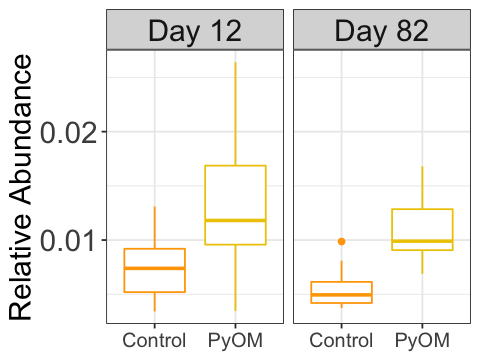

In [13]:
options(repr.plot.width=4, repr.plot.height=3)
df.plot = df %>% filter(PyOM != "OM")
p = ggplot(df.plot)
p = p + geom_boxplot(aes(y=RelAbund,x=PyOM,color=PyOM))
p = p + facet_wrap(~Incubation_Time_Weeks)
p = p + theme_bw()
p = p + theme(axis.text.y = element_text(size=18),axis.text.x = element_text(size=12),
              strip.text=element_text(size=18),legend.text=element_text(size=18))
p = p + theme(axis.title.x = element_blank())
p = p + theme(axis.title.y = element_text(size=18))
#p = p + theme(axis.text.x = element_text(angle=90,hjust=1, vjust=0.5))
palette = c("orange","gold2","red3")
p = p + scale_color_manual(values=palette,guide=guide_legend(title = NULL))
p = p + theme(legend.position="none") + ylab("Relative Abundance")
p

## Regularly scheduled programming

In [2]:
ps.wu = readRDS(file = "wu.ps")
ps.imparato = readRDS(file = "imparato.ps")
ps.yao = readRDS(file = "yao.ps")
ps.dai2016 = readRDS(file = "dai2016.ps")
ps.dai2017 = readRDS(file = "dai2017.ps")
ps.song = readRDS(file = "song.ps")
ps.whitman = readRDS(file = "whitman.ps")
ps.ye = readRDS(file = "ps.ye")
ps.nielsen2014 = readRDS(file = "ps.nielsen2014")
ps.xu = readRDS(file = "ps.xu")

In [12]:
# Troubleshooting BLAST scripts
head(tax_table(ps.dai2017) [c("ea29c1b3b4f8b01982feed38c82242ff","7420fbee1f962f3c465758e0090090c1","2d77e84dd6180e6c392151a49457a01a","0027deca91655d33b278a10be861c1e4","d92f2c2a4cbc1855bdd5bb392a79a44c")]) 

,Domain,Phylum,Class,Order,Family,Genus,Species
ea29c1b3b4f8b01982feed38c82242ff,Bacteria,Actinobacteria,Actinobacteria,Corynebacteriales,Corynebacteriaceae,Corynebacterium 1,uncultured bacterium
7420fbee1f962f3c465758e0090090c1,Bacteria,Actinobacteria,Actinobacteria,Corynebacteriales,Corynebacteriaceae,Corynebacterium 1,uncultured bacterium
2d77e84dd6180e6c392151a49457a01a,Bacteria,Actinobacteria,Actinobacteria,Corynebacteriales,Corynebacteriaceae,Corynebacterium 1,uncultured bacterium
0027deca91655d33b278a10be861c1e4,Bacteria,Actinobacteria,Actinobacteria,Corynebacteriales,Corynebacteriaceae,Corynebacterium 1,uncultured bacterium
d92f2c2a4cbc1855bdd5bb392a79a44c,Bacteria,Actinobacteria,Actinobacteria,Corynebacteriales,Corynebacteriaceae,Corynebacterium 1,NA


## Wu

In [14]:
ps_wu.norm = transform_sample_counts(ps.wu, function(x) x/sum(x))

In [15]:
mdf_wu = psmelt(ps_wu.norm)

In [16]:
mdf_wu

,OTU,Sample,Abundance,GeographicalLocation,PyOM.Temp,Sampling_Depth_cm,CurrentLandUse,FwdBarcode,NucleicAcidExtraction,Feedstock,⋯,pH,Region,PyOM,Domain,Phylum,Class,Order,Family,Genus,Species
157,0c457766cb8f9280f31e57ac199585d7,SRR2919161-X,0.07885533,China,450,10,Wetland,AGTTCC,Yang et al. 2017,corncob,⋯,7.72,V3,PyOM,Bacteria,Actinobacteria,Actinobacteria,Micrococcales,Micrococcaceae,NA,NA
74,07bc6143551e38126cbac2eb9c5f5a51,SRR2919161-X,0.05786963,China,450,10,Wetland,AGTTCC,Yang et al. 2017,corncob,⋯,7.72,V3,PyOM,Bacteria,Actinobacteria,Actinobacteria,Propionibacteriales,Nocardioidaceae,Marmoricola,NA
1140,68deb66583d36f3a0097c7289805819e,SRR2919162-X,0.05673967,China,450,10,Wetland,GTACTT,Yang et al. 2017,corncob,⋯,7.54,V3,OM,Bacteria,Bacteroidetes,Bacteroidia,Cytophagales,Microscillaceae,Ohtaekwangia,uncultured bacterium
195,0e24a2d3366bc20144d9b6dc678cf75e,SRR2919159-X,0.04823865,China,NA,10,Wetland,CTTCCA,Yang et al. 2017,NA,⋯,7.57,V3,Control,Bacteria,Gemmatimonadetes,Gemmatimonadetes,Gemmatimonadales,Gemmatimonadaceae,Gemmatimonas,uncultured bacterium
654,3696af7ebd762c1f8f1a67ac7e4f5218,SRR2919162-X,0.04615611,China,450,10,Wetland,GTACTT,Yang et al. 2017,corncob,⋯,7.54,V3,OM,Bacteria,Bacteroidetes,Bacteroidia,Flavobacteriales,Flavobacteriaceae,Confluentibacter,uncultured bacterium
273,153fbe3263e8bd689b238ce77b4bd1f9,SRR2919162-X,0.04483316,China,450,10,Wetland,GTACTT,Yang et al. 2017,corncob,⋯,7.54,V3,OM,Bacteria,Bacteroidetes,Bacteroidia,Flavobacteriales,Flavobacteriaceae,Confluentibacter,uncultured bacterium
193,0e24a2d3366bc20144d9b6dc678cf75e,SRR2919163-X,0.04046921,China,450,10,Wetland,CAGATC,Yang et al. 2017,corncob,⋯,7.30,V3,PyOM,Bacteria,Gemmatimonadetes,Gemmatimonadetes,Gemmatimonadales,Gemmatimonadaceae,Gemmatimonas,uncultured bacterium
1136,68deb66583d36f3a0097c7289805819e,SRR2919160-X,0.03592637,China,NA,10,Wetland,TGACCA,Yang et al. 2017,NA,⋯,7.27,V3,OM,Bacteria,Bacteroidetes,Bacteroidia,Cytophagales,Microscillaceae,Ohtaekwangia,uncultured bacterium
73,07bc6143551e38126cbac2eb9c5f5a51,SRR2919159-X,0.03459219,China,NA,10,Wetland,CTTCCA,Yang et al. 2017,NA,⋯,7.57,V3,Control,Bacteria,Actinobacteria,Actinobacteria,Propionibacteriales,Nocardioidaceae,Marmoricola,NA
925,54b88778c80e70609eadf1e54860ff36,SRR2919162-X,0.03351463,China,450,10,Wetland,GTACTT,Yang et al. 2017,corncob,⋯,7.54,V3,OM,Bacteria,Proteobacteria,Alphaproteobacteria,Sphingomonadales,Sphingomonadaceae,Ellin6055,uncultured bacterium


In [19]:
df_wu = mdf_wu %>%
    group_by(Sample , Phylum , Treatment , PyOM )%>%
    summarize(Abundance=sum(Abundance))
df_wu
# Grouping by sample, and phylum, add up total abundance of all OTUs in that phylum.

Sample,Phylum,Treatment,PyOM,Abundance
SRR2919159-X,Acidobacteria,Control,Control,0.090130117
SRR2919159-X,Actinobacteria,Control,Control,0.279593780
SRR2919159-X,Armatimonadetes,Control,Control,0.000000000
SRR2919159-X,Bacteroidetes,Control,Control,0.208505236
SRR2919159-X,Chloroflexi,Control,Control,0.058711520
SRR2919159-X,Cyanobacteria,Control,Control,0.001269438
SRR2919159-X,Elusimicrobia,Control,Control,0.000000000
SRR2919159-X,FBP,Control,Control,0.000000000
SRR2919159-X,Firmicutes,Control,Control,0.000000000
SRR2919159-X,GAL15,Control,Control,0.002856236


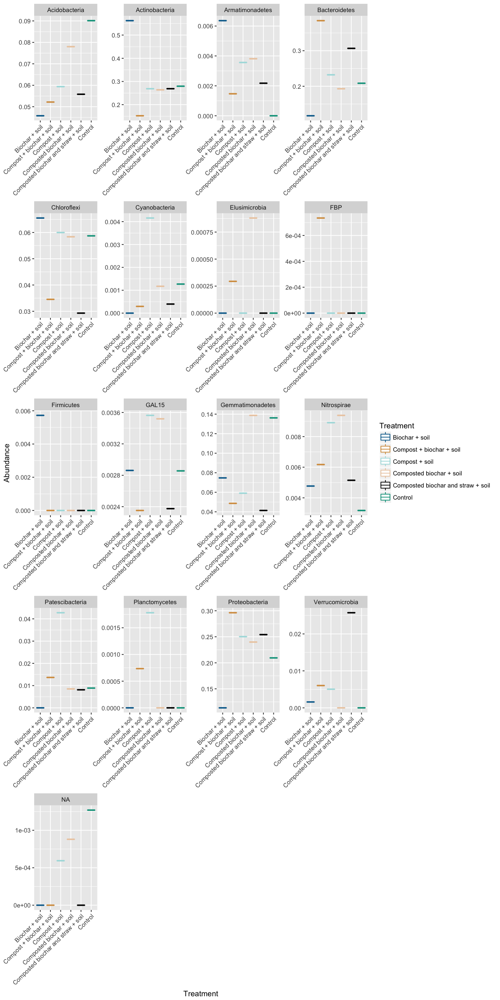

In [12]:
options(repr.plot.width=10, repr.plot.height=20)

p = ggplot(data=df_wu, aes(x = Treatment , y = Abundance , color = Treatment))
p = p + geom_boxplot()
p = p + theme(axis.text.x = element_text(angle=45,hjust=1))
palette = c(wes_palette("Darjeeling2"),wes_palette("Darjeeling1")[2:4])
palette = palette[c(2,3,4,1,5,6)]
p = p + scale_color_manual(values=palette)
p = p + facet_wrap(~Phylum, scales="free", ncol=4)
p


#Wu paper indicates the following trends regarding Relative Abundances:
    #Proteobacteria decreased with all amendments
    #Actinobacteria was highest in SB and lowest in SBC
    #Bacteriodetes was lowest in SB and highest in SBC
    #Acidobacteria and Gemmatimonadetes increased with SBCed and decreased with others
    #Chloroflexi, Verrucomicrobia, and Candidate division TM7 were unchanged




## Imparato

In [3]:
ps_imparato.norm = transform_sample_counts(ps.imparato, function(x) x/sum(x))

In [4]:
mdf_imparato = psmelt(ps_imparato.norm)

In [5]:
mdf_imparato

,OTU,Sample,Abundance,Feedstock,Clay,t.per.ha.PyOM,NucleicAcidExtraction,pH,X.C,ForwardPrimerName,⋯,CollectionYear,ReversePrimerSequence,PyOM,Domain,Phylum,Class,Order,Family,Genus,Species
664165,d99560e07abd6098e6e3cb2364914fe6,SRR3586000-X,0.12524020,winter wheat,14,14.26,PowerLyzer PowerSoil DNA Isolation Kit,7.42,2,341F,⋯,Nov-13,GTCTCGTGGGCTCGGAGATGTGTATAAGAGACAGGGACTACNNGGGTATCTAAT,PyOM,Archaea,Thaumarchaeota,Nitrososphaeria,Nitrososphaerales,Nitrososphaeraceae,NA,NA
664169,d99560e07abd6098e6e3cb2364914fe6,SRR3586025-X,0.11380409,winter wheat,14,0,PowerLyzer PowerSoil DNA Isolation Kit,7.17,1.9,341F,⋯,Nov-13,GTCTCGTGGGCTCGGAGATGTGTATAAGAGACAGGGACTACNNGGGTATCTAAT,OM,Archaea,Thaumarchaeota,Nitrososphaeria,Nitrososphaerales,Nitrososphaeraceae,NA,NA
664175,d99560e07abd6098e6e3cb2364914fe6,SRR3586026-X,0.11158868,winter wheat,14,0,PowerLyzer PowerSoil DNA Isolation Kit,7.17,1.9,341F,⋯,Nov-13,GTCTCGTGGGCTCGGAGATGTGTATAAGAGACAGGGACTACNNGGGTATCTAAT,OM,Archaea,Thaumarchaeota,Nitrososphaeria,Nitrososphaerales,Nitrososphaeraceae,NA,NA
664190,d99560e07abd6098e6e3cb2364914fe6,SRR3586001-X,0.09661935,winter wheat,14,14.26,PowerLyzer PowerSoil DNA Isolation Kit,7.42,2,341F,⋯,Nov-13,GTCTCGTGGGCTCGGAGATGTGTATAAGAGACAGGGACTACNNGGGTATCTAAT,PyOM,Archaea,Thaumarchaeota,Nitrososphaeria,Nitrososphaerales,Nitrososphaeraceae,NA,NA
664200,d99560e07abd6098e6e3cb2364914fe6,SRR3586022-X,0.09548652,winter wheat,14,0,PowerLyzer PowerSoil DNA Isolation Kit,7.17,1.9,341F,⋯,Nov-13,GTCTCGTGGGCTCGGAGATGTGTATAAGAGACAGGGACTACNNGGGTATCTAAT,OM,Archaea,Thaumarchaeota,Nitrososphaeria,Nitrososphaerales,Nitrososphaeraceae,NA,NA
664194,d99560e07abd6098e6e3cb2364914fe6,SRR3586016-X,0.09368722,winter wheat,14,2.3,PowerLyzer PowerSoil DNA Isolation Kit,7.26,2,341F,⋯,Nov-13,GTCTCGTGGGCTCGGAGATGTGTATAAGAGACAGGGACTACNNGGGTATCTAAT,PyOM,Archaea,Thaumarchaeota,Nitrososphaeria,Nitrososphaerales,Nitrososphaeraceae,NA,NA
664197,d99560e07abd6098e6e3cb2364914fe6,SRR3586032-X,0.08841273,NA,14,0,PowerLyzer PowerSoil DNA Isolation Kit,6.95,1.9,341F,⋯,Nov-13,GTCTCGTGGGCTCGGAGATGTGTATAAGAGACAGGGACTACNNGGGTATCTAAT,Control,Archaea,Thaumarchaeota,Nitrososphaeria,Nitrososphaerales,Nitrososphaeraceae,NA,NA
664171,d99560e07abd6098e6e3cb2364914fe6,SRR3586013-X,0.08796042,winter wheat,14,2.3,PowerLyzer PowerSoil DNA Isolation Kit,7.26,2,341F,⋯,Nov-13,GTCTCGTGGGCTCGGAGATGTGTATAAGAGACAGGGACTACNNGGGTATCTAAT,PyOM,Archaea,Thaumarchaeota,Nitrososphaeria,Nitrososphaerales,Nitrososphaeraceae,NA,NA
664198,d99560e07abd6098e6e3cb2364914fe6,SRR3586017-X,0.08767496,winter wheat,14,2.3,PowerLyzer PowerSoil DNA Isolation Kit,7.26,2,341F,⋯,Nov-13,GTCTCGTGGGCTCGGAGATGTGTATAAGAGACAGGGACTACNNGGGTATCTAAT,PyOM,Archaea,Thaumarchaeota,Nitrososphaeria,Nitrososphaerales,Nitrososphaeraceae,NA,NA
664196,d99560e07abd6098e6e3cb2364914fe6,SRR3586006-X,0.08426301,winter wheat,14,14.26,PowerLyzer PowerSoil DNA Isolation Kit,7.42,2,341F,⋯,Nov-13,GTCTCGTGGGCTCGGAGATGTGTATAAGAGACAGGGACTACNNGGGTATCTAAT,PyOM,Archaea,Thaumarchaeota,Nitrososphaeria,Nitrososphaerales,Nitrososphaeraceae,NA,NA


In [6]:
df_imparato = mdf_imparato %>%
    group_by(Sample , Phylum , Treatment , PyOM )%>%
    summarize(Abundance=sum(Abundance))
head(df_imparato)
# Grouping by sample, and phylum, add up total abundance of all OTUs in that phylum.

Sample,Phylum,Treatment,PyOM,Abundance
SRR3586000-X,Acidobacteria,High GBC,PyOM,0.083883365
SRR3586000-X,Actinobacteria,High GBC,PyOM,0.204361267
SRR3586000-X,Armatimonadetes,High GBC,PyOM,0.000000000
SRR3586000-X,Bacteroidetes,High GBC,PyOM,0.003843262
SRR3586000-X,BRC1,High GBC,PyOM,0.000000000
SRR3586000-X,Chlamydiae,High GBC,PyOM,0.000000000


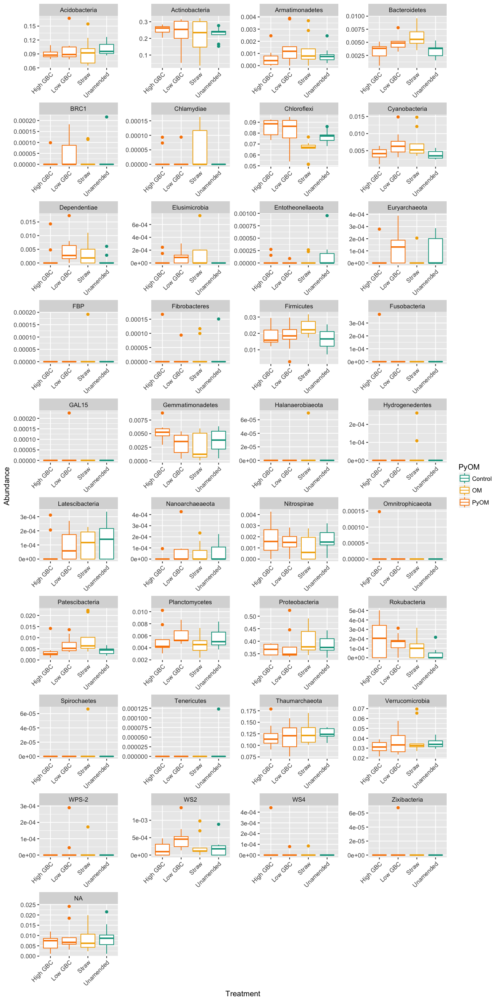

In [8]:
options(repr.plot.width=10, repr.plot.height=20)

#MajPhy = c("Verrucomicrobia", "Proteobacteria", "Planctomycetes", "Nitrospirae", "Gemmatimonadetes", "Firmicutes",
#"Chloroflexi", "Bacteroidetes", "Armatimonadetes", "Actinobacteria", "Acidobacteria")

#df = df %>%
#    filter(Phylum %in% MajPhy)%>%
#    mutate(SeverityLand = paste(Land_Class,Severity_Class))

p = ggplot(data=df_imparato, aes(x = Treatment , y = Abundance , color = PyOM))
p = p + geom_boxplot()
p = p + theme(axis.text.x = element_text(angle=45,hjust=1))
palette = c(wes_palette("Darjeeling1"),wes_palette("Darjeeling2")[2:4])
palette = palette[c(2,3,4,1,5,6)]
p = p + scale_color_manual(values=palette)
p = p + facet_wrap(~Phylum, scales="free", ncol=4)
p

## Dai 2017

In [3]:
ps_dai2017.norm = transform_sample_counts(ps.dai2017, function(x) x/sum(x))

In [4]:
mdf_dai2017 = psmelt(ps_dai2017.norm)

In [10]:
Mesorhizobium = mdf_dai2017%>%
    filter(PyOM %in% c("Control","PyOM"))%>%
    filter(Genus=="Mesorhizobium")%>%
    group_by(OTU,PyOM)%>%
    summarize(Sum = sum(Abundance))
Mesorhizobium

OTU,PyOM,Sum
02a04bdf833bfa39508f47177b93ea93,Control,0.000000e+00
02a04bdf833bfa39508f47177b93ea93,PyOM,4.624356e-04
411d06f01cefc00df41dcf83012755f1,Control,0.000000e+00
411d06f01cefc00df41dcf83012755f1,PyOM,0.000000e+00
4a0e714b03a7fc4470084c30a4de2eb2,Control,0.000000e+00
4a0e714b03a7fc4470084c30a4de2eb2,PyOM,6.915596e-03
7e954249076830580a0dc6665e22c29b,Control,0.000000e+00
7e954249076830580a0dc6665e22c29b,PyOM,0.000000e+00
84d41250edc9c9069fc5d1211b02f1ec,Control,0.000000e+00
84d41250edc9c9069fc5d1211b02f1ec,PyOM,0.000000e+00


In [25]:
df_dai2017 = mdf_dai2017 %>%
    group_by(Sample , Phylum , Treatment , SoilType )%>%
    summarize(Abundance=sum(Abundance))
head(df_dai2017)
# Grouping by sample, and phylum, add up total abundance of all OTUs in that phylum.

Sample,Phylum,Treatment,SoilType,Abundance
SRR3681435-X,Acidobacteria,Ar300,Argiustoll,0.1369427513
SRR3681435-X,Actinobacteria,Ar300,Argiustoll,0.2320066930
SRR3681435-X,Armatimonadetes,Ar300,Argiustoll,0.0016971435
SRR3681435-X,Bacteroidetes,Ar300,Argiustoll,0.0003585515
SRR3681435-X,Chloroflexi,Ar300,Argiustoll,0.1371578822
SRR3681435-X,Cyanobacteria,Ar300,Argiustoll,0.0000000000


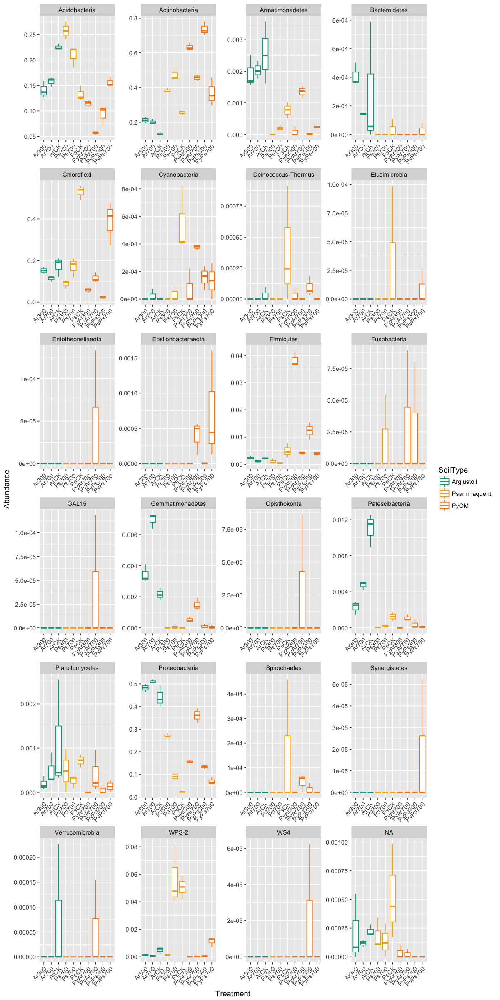

In [26]:
options(repr.plot.width=10, repr.plot.height=20)

#MajPhy = c("Verrucomicrobia", "Proteobacteria", "Planctomycetes", "Nitrospirae", "Gemmatimonadetes", "Firmicutes",
#"Chloroflexi", "Bacteroidetes", "Armatimonadetes", "Actinobacteria", "Acidobacteria")

#df = df %>%
#    filter(Phylum %in% MajPhy)%>%
#    mutate(SeverityLand = paste(Land_Class,Severity_Class))

p = ggplot(data=df_dai2017, aes(x = Treatment , y = Abundance , color = SoilType))
p = p + geom_boxplot()
p = p + theme(axis.text.x = element_text(angle=45,hjust=1))
palette = c(wes_palette("Darjeeling1"),wes_palette("Darjeeling2")[2:4])
palette = palette[c(2,3,4,1,5,6)]
p = p + scale_color_manual(values=palette)
p = p + facet_wrap(~Phylum, scales="free", ncol=4)
p




#Author interpretations
    #Dominant phylum regardless of PyOM and soil type- Actinobacteria, Proteobacteria, Chloroflexi, Acidobacteria
    #Actinobacteria in PyOMs were significantly higher than controls

## Dai 2016

In [11]:
ps_dai2016.norm = transform_sample_counts(ps.dai2016, function(x) x/sum(x))

In [12]:
mdf_dai2016 = psmelt(ps_dai2016.norm)

In [13]:
Mesorhizobium = mdf_dai2016%>%
    filter(PyOM %in% c("Control","PyOM"))%>%
    filter(Genus=="Mesorhizobium")%>%
    group_by(OTU,PyOM)%>%
    summarize(Sum = sum(Abundance))
Mesorhizobium

OTU,PyOM,Sum
043853990dccc6a90ad2de0dbe120d8f,Control,0.001594896
043853990dccc6a90ad2de0dbe120d8f,PyOM,0.008999963


In [12]:
df_dai2016 = mdf_dai2016 %>%
    group_by(Sample , Phylum , Treatment , PyOM )%>%
    summarize(Abundance=sum(Abundance))
head(df_dai2016)
# Grouping by sample, and phylum, add up total abundance of all OTUs in that phylum.

Sample,Phylum,Treatment,PyOM,Abundance
SRR3466117-X,Acidobacteria,BuCK,Control,0.092091571
SRR3466117-X,Actinobacteria,BuCK,Control,0.021331946
SRR3466117-X,Armatimonadetes,BuCK,Control,0.007284079
SRR3466117-X,Bacteroidetes,BuCK,Control,0.030176899
SRR3466117-X,BRC1,BuCK,Control,0.000000000
SRR3466117-X,Chlamydiae,BuCK,Control,0.000000000


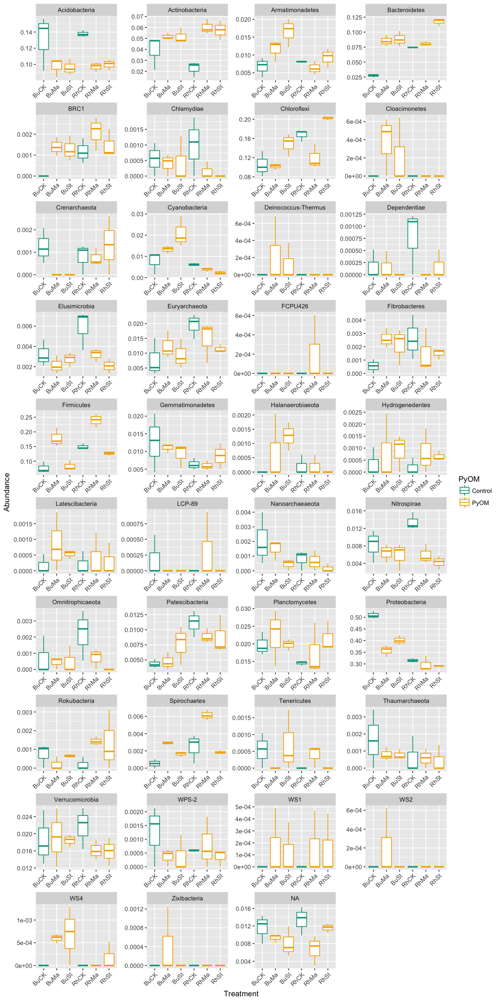

In [13]:
options(repr.plot.width=10, repr.plot.height=20)

#MajPhy = c("Verrucomicrobia", "Proteobacteria", "Planctomycetes", "Nitrospirae", "Gemmatimonadetes", "Firmicutes",
#"Chloroflexi", "Bacteroidetes", "Armatimonadetes", "Actinobacteria", "Acidobacteria")

#df = df %>%
#    filter(Phylum %in% MajPhy)%>%
#    mutate(SeverityLand = paste(Land_Class,Severity_Class))

p = ggplot(data=df_dai2016, aes(x = Treatment , y = Abundance , color = PyOM))
p = p + geom_boxplot()
p = p + theme(axis.text.x = element_text(angle=45,hjust=1))
palette = c(wes_palette("Darjeeling1"),wes_palette("Darjeeling2")[2:4])
palette = palette[c(2,3,4,1,5,6)]
p = p + scale_color_manual(values=palette)
p = p + facet_wrap(~Phylum, scales="free", ncol=4)
p



#Author findings:
    #PyOM addition decreased relative abundance of Acidobacteria in Rh and Bu soil
    #PyOM addition increased relative abundance of Bacteriodetes in Rh and Bu soil
    #PyOM decreased relative abundance of Betaproteobacteria in Bu soil and increased in Rh
    #PyOM increased relative abundance of Actinobacteria nad Alphaproteobacteria in Rh
    #No change in Firmicutes

## Yao

In [33]:
ps_yao.norm = transform_sample_counts(ps.yao, function(x) x/sum(x))

In [34]:
mdf_yao = psmelt(ps_yao.norm)

In [35]:
mdf_yao

,OTU,Sample,Abundance,CollectionDate,TargetGene,Organism,Sand,Silt,Clay,FwdBarcode,⋯,Author,Incubation_Time_Weeks,BioSample,Domain,Phylum,Class,Order,Family,Genus,Species
185683,c2cdaf01de4b2ce2e02c78559acdff90,SRR4450619-X,0.02954399,Oct-14,16S rRNA,soil metagenome,,,,TGACCA,⋯,Yao,128,SAMN05904539,Bacteria,Actinobacteria,Actinobacteria,Micrococcales,Micrococcaceae,NA,NA
185695,c2cdaf01de4b2ce2e02c78559acdff90,SRR4450612-X,0.02651379,Oct-14,16S rRNA,soil metagenome,,,,AGAGTA,⋯,Yao,128,SAMN05904536,Bacteria,Actinobacteria,Actinobacteria,Micrococcales,Micrococcaceae,NA,NA
239802,fab6456c8e6abe7858eaa9afa96007c3,SRR4450560-X,0.02365203,Aug-14,16S rRNA,soil metagenome,,,,GGTTGT,⋯,Yao,121,SAMN05904525,Bacteria,Proteobacteria,Gammaproteobacteria,Xanthomonadales,Rhodanobacteraceae,Rhodanobacter,Ambiguous_taxa
185703,c2cdaf01de4b2ce2e02c78559acdff90,SRR4450616-X,0.02351057,Oct-14,16S rRNA,soil metagenome,,,,CTTCCA,⋯,Yao,128,SAMN05904538,Bacteria,Actinobacteria,Actinobacteria,Micrococcales,Micrococcaceae,NA,NA
185698,c2cdaf01de4b2ce2e02c78559acdff90,SRR4450606-X,0.02243660,Oct-14,16S rRNA,soil metagenome,,,,GTTTCG,⋯,Yao,128,SAMN05904533,Bacteria,Actinobacteria,Actinobacteria,Micrococcales,Micrococcaceae,NA,NA
185696,c2cdaf01de4b2ce2e02c78559acdff90,SRR4450602-X,0.02227460,Oct-14,16S rRNA,soil metagenome,,,,TCCCGA,⋯,Yao,128,SAMN05904531,Bacteria,Actinobacteria,Actinobacteria,Micrococcales,Micrococcaceae,NA,NA
185697,c2cdaf01de4b2ce2e02c78559acdff90,SRR4450600-X,0.02191667,Oct-14,16S rRNA,soil metagenome,,,,CGTACG,⋯,Yao,128,SAMN05904530,Bacteria,Actinobacteria,Actinobacteria,Micrococcales,Micrococcaceae,NA,NA
185694,c2cdaf01de4b2ce2e02c78559acdff90,SRR4450558-X,0.02165041,Aug-14,16S rRNA,soil metagenome,,,,ATCGTA,⋯,Yao,121,SAMN05904524,Bacteria,Actinobacteria,Actinobacteria,Micrococcales,Micrococcaceae,NA,NA
185672,c2cdaf01de4b2ce2e02c78559acdff90,SRR4450608-X,0.02147334,Oct-14,16S rRNA,soil metagenome,,,,CTGCTG,⋯,Yao,128,SAMN05904534,Bacteria,Actinobacteria,Actinobacteria,Micrococcales,Micrococcaceae,NA,NA
213240,defcdde38079457b10637d9503ccbfd8,SRR4450556-X,0.02137620,Aug-14,16S rRNA,soil metagenome,,,,TCGGCA,⋯,Yao,121,SAMN05904523,Bacteria,Cyanobacteria,Oxyphotobacteria,Chloroplast,Citrus maxima,Citrus maxima,Citrus maxima


In [40]:
df_yao = mdf_yao %>%
    group_by(Sample , Phylum , CollectionDate , Treatment )%>%
    summarize(Abundance=sum(Abundance))
head(df_yao)
# Grouping by sample, and phylum, add up total abundance of all OTUs in that phylum.

Sample,Phylum,CollectionDate,Treatment,Abundance
SRR4446119-X,Acidobacteria,Apr-14,NA,0.271205008
SRR4446119-X,Actinobacteria,Apr-14,NA,0.164580073
SRR4446119-X,Armatimonadetes,Apr-14,NA,0.006311946
SRR4446119-X,Bacteroidetes,Apr-14,NA,0.053468962
SRR4446119-X,BRC1,Apr-14,NA,0.000000000
SRR4446119-X,Chloroflexi,Apr-14,NA,0.058998435


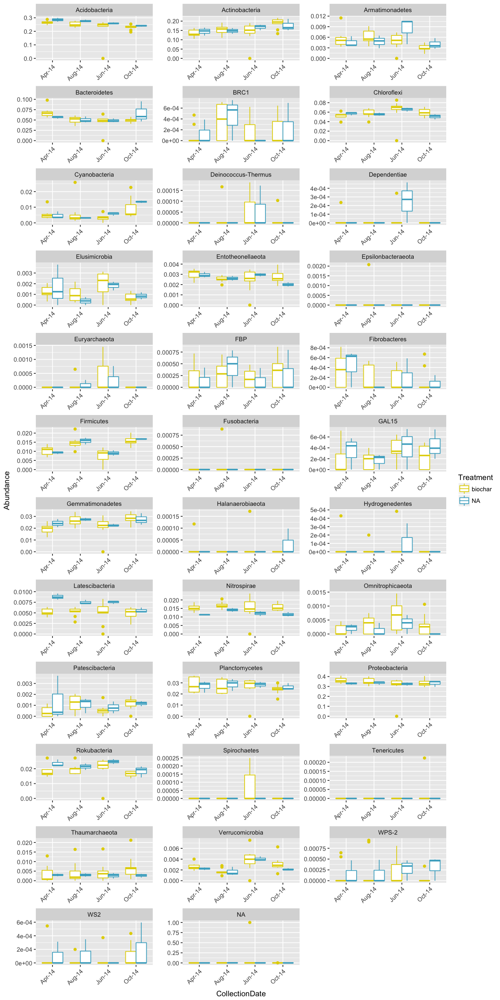

In [42]:
options(repr.plot.width=10, repr.plot.height=20)

#MajPhy = c("Verrucomicrobia", "Proteobacteria", "Planctomycetes", "Nitrospirae", "Gemmatimonadetes", "Firmicutes",
#"Chloroflexi", "Bacteroidetes", "Armatimonadetes", "Actinobacteria", "Acidobacteria")

#df = df %>%
#    filter(Phylum %in% MajPhy)%>%
#    mutate(SeverityLand = paste(Land_Class,Severity_Class))


p = ggplot(data=df_yao, aes(x = CollectionDate , y = Abundance , color = Treatment))
p = p + geom_boxplot()
p = p + theme(axis.text.x = element_text(angle=45,hjust=1))
palette = c(wes_palette("FantasticFox1"),wes_palette("Darjeeling1")[1:4])
palette = palette[c(2,3,4,1,5,6,7,8,9)]
p = p + scale_color_manual(values=palette)
p = p + facet_wrap(~Phylum, scales="free", ncol=3)
p


#Author findings:
    #Dominant bacterial phyla: Proteobacteria, Acidobacteria, Actinobacteria, Chloroflexi, Bacteriodetes
    #Less abundant phyla: Planctomycetes, Gemmatimonadetes, Nitrospirae, Firmicutes, Armatimonadetes, Latescibacteria, 
        #Cyanobacteria, Thaumarcheaota, Saccharibacteria, Chlorobi, Verrucomicrobia, and Elusimicrobia
    #Relative abundances of Acidobacteria and Latescibacteria decreased
    #Relative abundances of Chlorobi and Chloroflexi were increased


## Song

In [20]:
ps_song.norm = transform_sample_counts(ps.song, function(x) x/sum(x))

In [21]:
mdf_song = psmelt(ps_song.norm)

In [22]:
mdf_song

,OTU,Sample,Abundance,SequencingMethod,TargetGene,Habitat,NCBISampleID,ForwardPrimerName,Sampling_Depth_cm,ForwardPrimerSequence,⋯,Author,SoilType,PyOM,Domain,Phylum,Class,Order,Family,Genus,Species
33714,21d3edfa87d24fef38523b1ed84e6c10,SRR3984779-X,0.17503892,Illumina MiSeq,16S rRNA,PAH-contaminated field,A62,338F,20,ACTCCTACGGGAGGCAGCA,⋯,Song,Song,Control,Bacteria,Firmicutes,Bacilli,Bacillales,Bacillaceae,Bacillus,NA
33720,21d3edfa87d24fef38523b1ed84e6c10,SRR3984740-X,0.16055883,Illumina MiSeq,16S rRNA,PAH-contaminated field,E32,338F,20,ACTCCTACGGGAGGCAGCA,⋯,Song,Song,PyOM,Bacteria,Firmicutes,Bacilli,Bacillales,Bacillaceae,Bacillus,NA
33735,21d3edfa87d24fef38523b1ed84e6c10,SRR3984767-X,0.14811208,Illumina MiSeq,16S rRNA,PAH-contaminated field,A61,338F,20,ACTCCTACGGGAGGCAGCA,⋯,Song,Song,Control,Bacteria,Firmicutes,Bacilli,Bacillales,Bacillaceae,Bacillus,NA
33715,21d3edfa87d24fef38523b1ed84e6c10,SRR3984723-X,0.14226144,Illumina MiSeq,16S rRNA,PAH-contaminated field,C32,338F,20,ACTCCTACGGGAGGCAGCA,⋯,Song,Song,PyOM,Bacteria,Firmicutes,Bacilli,Bacillales,Bacillaceae,Bacillus,NA
33734,21d3edfa87d24fef38523b1ed84e6c10,SRR3984722-X,0.14101586,Illumina MiSeq,16S rRNA,PAH-contaminated field,C31,338F,20,ACTCCTACGGGAGGCAGCA,⋯,Song,Song,PyOM,Bacteria,Firmicutes,Bacilli,Bacillales,Bacillaceae,Bacillus,NA
33721,21d3edfa87d24fef38523b1ed84e6c10,SRR3984725-X,0.13685013,Illumina MiSeq,16S rRNA,PAH-contaminated field,C62,338F,20,ACTCCTACGGGAGGCAGCA,⋯,Song,Song,PyOM,Bacteria,Firmicutes,Bacilli,Bacillales,Bacillaceae,Bacillus,NA
33718,21d3edfa87d24fef38523b1ed84e6c10,SRR3984742-X,0.13346963,Illumina MiSeq,16S rRNA,PAH-contaminated field,E62,338F,20,ACTCCTACGGGAGGCAGCA,⋯,Song,Song,PyOM,Bacteria,Firmicutes,Bacilli,Bacillales,Bacillaceae,Bacillus,NA
33740,21d3edfa87d24fef38523b1ed84e6c10,SRR3984734-X,0.12987575,Illumina MiSeq,16S rRNA,PAH-contaminated field,D62,338F,20,ACTCCTACGGGAGGCAGCA,⋯,Song,Song,PyOM,Bacteria,Firmicutes,Bacilli,Bacillales,Bacillaceae,Bacillus,NA
33726,21d3edfa87d24fef38523b1ed84e6c10,SRR3984741-X,0.12423002,Illumina MiSeq,16S rRNA,PAH-contaminated field,E61,338F,20,ACTCCTACGGGAGGCAGCA,⋯,Song,Song,PyOM,Bacteria,Firmicutes,Bacilli,Bacillales,Bacillaceae,Bacillus,NA
33727,21d3edfa87d24fef38523b1ed84e6c10,SRR3984733-X,0.12181554,Illumina MiSeq,16S rRNA,PAH-contaminated field,D61,338F,20,ACTCCTACGGGAGGCAGCA,⋯,Song,Song,PyOM,Bacteria,Firmicutes,Bacilli,Bacillales,Bacillaceae,Bacillus,NA


In [23]:
df_song = mdf_song %>%
    group_by(Sample , Phylum , Treatment , Incubation_Time_Weeks )%>%
    summarize(Abundance=sum(Abundance))
head(df_song)
# Grouping by sample, and phylum, add up total abundance of all OTUs in that phylum.

Sample,Phylum,Treatment,Incubation_Time_Weeks,Abundance
SRR3984709-X,Acidobacteria,Control,0,0.0423094235
SRR3984709-X,Actinobacteria,Control,0,0.0672695282
SRR3984709-X,Armatimonadetes,Control,0,0.0007774459
SRR3984709-X,Bacteroidetes,Control,0,0.1071238594
SRR3984709-X,BRC1,Control,0,0.0002045910
SRR3984709-X,Chlamydiae,Control,0,0.0000000000


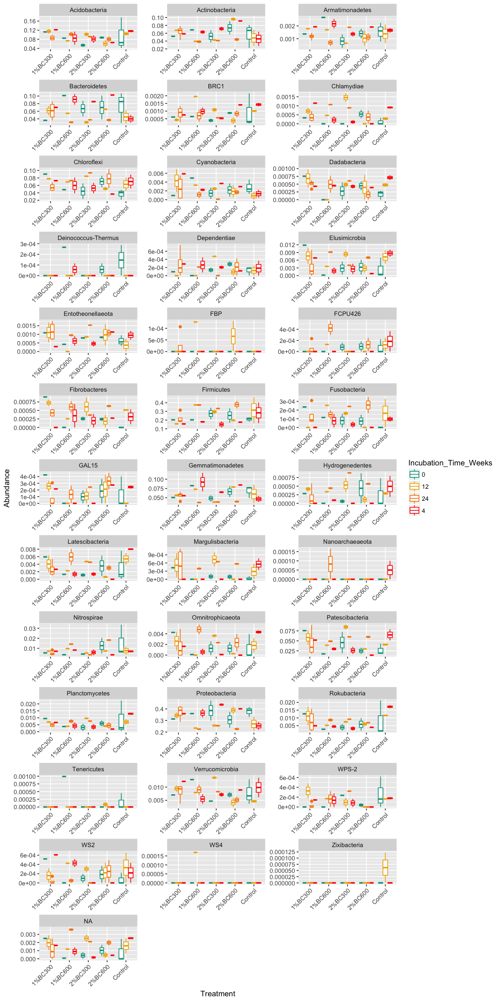

In [25]:
options(repr.plot.width=10, repr.plot.height=20)

#MajPhy = c("Verrucomicrobia", "Proteobacteria", "Planctomycetes", "Nitrospirae", "Gemmatimonadetes", "Firmicutes",
#"Chloroflexi", "Bacteroidetes", "Armatimonadetes", "Actinobacteria", "Acidobacteria")

#df = df %>%
#    filter(Phylum %in% MajPhy)%>%
#    mutate(SeverityLand = paste(Land_Class,Severity_Class))

p = ggplot(data=df_song, aes(x = Treatment , y = Abundance , color = Incubation_Time_Weeks))
p = p + geom_boxplot()
p = p + theme(axis.text.x = element_text(angle=45,hjust=1))
palette = c(wes_palette("Darjeeling1"),wes_palette("Darjeeling2")[2:4])
palette = palette[c(2,3,4,1,5,6)]
p = p + scale_color_manual(values=palette)
p = p + facet_wrap(~Phylum, scales="free", ncol=3)
p


#The paper bases much of the analysis on incubation time- I do not have the incubation times that coordinate 
#with the samples

#Main trends indicated by authors:
    #communities clustered by incubation time:
        #incubation time is the main factor affecting changes in bacterial community structure during the final 
        #12 weeks of incubation
    #After 12 weeks, bacterial community showed changed by biochar type
    #Rice straw biochar shifted bacterial community after 6 wks incubation
    #Biochar decreased community after 12/26 wks 
    #2%BC300 caused more of a change than 2%BC600
    #1%BC causes greated difference in community structure than 2%BC

    #Proteobacteria, Firmicutes, Gemmatimonadetes, Acidobacteria, Chloroflexi, Actinobacteria, and Bacteriodetes were the most abundance phyla
    #Relative abundances of Proteobacteria, Bacteriodetes, Actinobacteria, and Gemmatimonadetes decreased with each treatment
    #Relative abundances of Firmicutes, Chloroflexi, Acidobacteria, and Parcubacteria increased after 24 wks 
    #State that biochar had limited effect on the main changes of bacterial phyla over time
    #For Proteobacteria, Firmicutes, Acidobacteria, Nitrospirae, Verrucomicrobia, Planctomycetes, and Parcubacteria, the
        #the changes in the relative abundance in the biochar-amended treatments relative to control happen after 12 wk incubation
        #Firmicutes showed the most change relative to control after 12 wks
        #Firmicutes was the most abundance phylum in the control after 24 wks- in BC600 it was the most abundant phylum after 12 wks
        #After 24 wks, abundances of Bacteriodetes, Actinobacteria, and Gemmatimonadetes in biochar ameneded treatments were increased

    #Abundances of genera
        #variations were greater in BC300 than BC600
        #in BC300, 2% application resulted in greater variation than 1% application in the first 12 wks, but less variation after 24 wks
        #

## Whitman

In [14]:
ps_whitman.norm = transform_sample_counts(ps.whitman, function(x) x/sum(x))

In [15]:
mdf_whitman = psmelt(ps_whitman.norm)

In [16]:
mdf_whitman 

,OTU,Sample,Abundance,ForwardPrimerName,SoilType,NucleicAcidExtraction,Feedstock,GeographicalLocation,ReversePrimerSequence,pH,⋯,X.C,BioSample,PyOM,Domain,Phylum,Class,Order,Family,Genus,Species
593237,928923383142d7c2a61880f1db043607,S242,0.16708588,515F,Mardin,MoBio PowerLyzer PowerSoil DNA isolation kit,NA,New York,CCGYCCAATTYMTTTRAGTTT,6,⋯,1.48,SAMN04588502,OM,Bacteria,Firmicutes,Bacilli,Bacillales,Bacillaceae,Bacillus,NA
961402,eed56ff9426f9369e12081d1dcccea59,S148,0.14981071,515F,Mardin,MoBio PowerLyzer PowerSoil DNA isolation kit,NA,New York,CCGYCCAATTYMTTTRAGTTT,6,⋯,1.48,SAMN04588422,OM,Bacteria,Bacteroidetes,Bacteroidia,Flavobacteriales,Flavobacteriaceae,Flavobacterium,NA
783097,c1b862ed4bb18ba8872b70f2f8402856,S145,0.12003865,515F,Mardin,MoBio PowerLyzer PowerSoil DNA isolation kit,NA,New York,CCGYCCAATTYMTTTRAGTTT,6,⋯,1.48,SAMN04588419,OM,Bacteria,Bacteroidetes,Bacteroidia,Flavobacteriales,Flavobacteriaceae,Flavobacterium,NA
393770,60c6f6a7d33b15a5f222bf85ba1739e4,S145,0.09380110,515F,Mardin,MoBio PowerLyzer PowerSoil DNA isolation kit,NA,New York,CCGYCCAATTYMTTTRAGTTT,6,⋯,1.48,SAMN04588419,OM,Bacteria,Proteobacteria,Gammaproteobacteria,Betaproteobacteriales,Burkholderiaceae,NA,NA
593315,928923383142d7c2a61880f1db043607,S243,0.08852118,515F,Mardin,MoBio PowerLyzer PowerSoil DNA isolation kit,NA,New York,CCGYCCAATTYMTTTRAGTTT,6,⋯,1.48,SAMN04588507,OM,Bacteria,Firmicutes,Bacilli,Bacillales,Bacillaceae,Bacillus,NA
593282,928923383142d7c2a61880f1db043607,S246,0.08833822,515F,Mardin,MoBio PowerLyzer PowerSoil DNA isolation kit,NA,New York,CCGYCCAATTYMTTTRAGTTT,6,⋯,1.48,SAMN04588512,OM,Bacteria,Firmicutes,Bacilli,Bacillales,Bacillaceae,Bacillus,NA
378596,5d16fc94a5642449f02c7de079028f49,S042,0.07696648,515F,Mardin,MoBio PowerLyzer PowerSoil DNA isolation kit,NA,New York,CCGYCCAATTYMTTTRAGTTT,6,⋯,1.48,SAMN04588372,OM,Bacteria,Cyanobacteria,Oxyphotobacteria,Chloroplast,Triticum aestivum (bread wheat),Triticum aestivum (bread wheat),Triticum aestivum (bread wheat)
593278,928923383142d7c2a61880f1db043607,S241,0.07693568,515F,Mardin,MoBio PowerLyzer PowerSoil DNA isolation kit,NA,New York,CCGYCCAATTYMTTTRAGTTT,6,⋯,1.48,SAMN04588500,OM,Bacteria,Firmicutes,Bacilli,Bacillales,Bacillaceae,Bacillus,NA
129636,211f3cf61d55c9b4f27124109371adb7,S141,0.07557161,515F,Mardin,MoBio PowerLyzer PowerSoil DNA isolation kit,NA,New York,CCGYCCAATTYMTTTRAGTTT,6,⋯,1.48,SAMN04588415,OM,Bacteria,Proteobacteria,Gammaproteobacteria,Enterobacteriales,Enterobacteriaceae,NA,NA
593268,928923383142d7c2a61880f1db043607,S245,0.07416582,515F,Mardin,MoBio PowerLyzer PowerSoil DNA isolation kit,NA,New York,CCGYCCAATTYMTTTRAGTTT,6,⋯,1.48,SAMN04588511,OM,Bacteria,Firmicutes,Bacilli,Bacillales,Bacillaceae,Bacillus,NA


In [19]:
df_whitman = mdf_whitman %>%
    group_by(Sample , Phylum , Treatment , PyOM )%>%
    summarize(Abundance=sum(Abundance))
head(df_whitman)
# Grouping by sample, and phylum, add up total abundance of all OTUs in that phylum.

Sample,Phylum,Treatment,PyOM,Abundance
S001,Acidobacteria,Unamended,Control,0.221234961
S001,Actinobacteria,Unamended,Control,0.081627714
S001,Armatimonadetes,Unamended,Control,0.005116858
S001,Bacteroidetes,Unamended,Control,0.084808464
S001,BRC1,Unamended,Control,0.000000000
S001,Chloroflexi,Unamended,Control,0.022057807


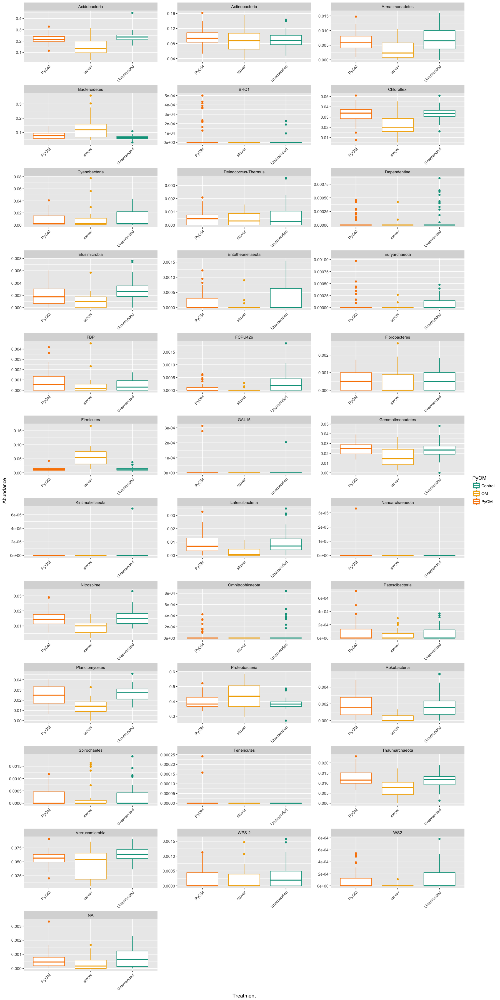

In [20]:
options(repr.plot.width=15, repr.plot.height=30)

#MajPhy = c("Verrucomicrobia", "Proteobacteria", "Planctomycetes", "Nitrospirae", "Gemmatimonadetes", "Firmicutes",
#"Chloroflexi", "Bacteroidetes", "Armatimonadetes", "Actinobacteria", "Acidobacteria")

#df = df %>%
#    filter(Phylum %in% MajPhy)%>%
#    mutate(SeverityLand = paste(Land_Class,Severity_Class))

p = ggplot(data=df_whitman, aes(x =  Treatment , y = Abundance , color = PyOM))
p = p + geom_boxplot()
p = p + theme(axis.text.x = element_text(angle=45,hjust=1))
palette = c(wes_palette("Darjeeling1"),wes_palette("Darjeeling2")[1:4])
palette = palette[c(2,3,4,1,5,6,7,8,9)]
p = p + scale_color_manual(values=palette)
p = p + facet_wrap(~Phylum, scales="free", ncol=3)
p


#Author findings:
    #Over time, unamended community composition stayed consistant; PyOM amended varied a little; Stover varied a lot
    #No changes on day one; day 12 stover changed a lot, PyOM didn't change
    #Day 82 PyOM and stover community composition was distingushable from unamended
    
    #PyOM addition cause decrease in Armatimonadetes and increase in Bacteroidetes 

In [7]:
ps.glom.order = readRDS(file = "ps.glom.order.ps")
ps.glom.genus = readRDS(file = "ps.glom.genus.ps")
ps.glom.family = readRDS(file = "ps.glom.family.ps")

## Ye

In [4]:
ps_ye.norm = transform_sample_counts(ps.ye, function(x) x/sum(x))

In [5]:
mdf_ye = psmelt(ps_ye.norm)

In [6]:
mdf_ye 

,OTU,Sample,Abundance,CurrentLandUse,X.SOM,FwdBarcode,SequencingMethod,Author,pH,Organism,⋯,Org_C,g.per.kg.PyOM,PyOM,Domain,Phylum,Class,Order,Family,Genus,Species
16525,4a6b3ff199d06dcedcc568828d7da242,SRR2559894-X,0.6206897,Experimental,,,Illumina Miseq,Ye,8.14,,⋯,17.05,1.5,OM,Unassigned,NA,NA,NA,NA,NA,NA
16532,4a6b3ff199d06dcedcc568828d7da242,SRR2559605-X,0.4932249,Experimental,,,Illumina Miseq,Ye,8.17,,⋯,,NA,OM,Unassigned,NA,NA,NA,NA,NA,NA
37525,b2061c70145410437c49b070557438d2,SRR2559890-X,0.4736842,Experimental,,,Illumina Miseq,Ye,8.14,,⋯,10.04,1.5,PyOM,Unassigned,NA,NA,NA,NA,NA,NA
16536,4a6b3ff199d06dcedcc568828d7da242,SRR2559895-X,0.3684211,Experimental,,,Illumina Miseq,Ye,8.14,,⋯,17.05,1.5,OM,Unassigned,NA,NA,NA,NA,NA,NA
1598,06e640970ccfeb7149762afeeca30c36,SRR2559887-X,0.3239437,Experimental,,,Illumina Miseq,Ye,8.14,,⋯,10.04,1.5,PyOM,Bacteria,NA,NA,NA,NA,NA,NA
16527,4a6b3ff199d06dcedcc568828d7da242,SRR2559883-X,0.3068182,Experimental,,,Illumina Miseq,Ye,8.14,,⋯,13.63,NA,OM,Unassigned,NA,NA,NA,NA,NA,NA
40850,c29fcf2d777589c661855c4a947ef2b3,SRR2559857-X,0.2496148,Experimental,,,Illumina Miseq,Ye,8.21,,⋯,9.54,NA,Control,Bacteria,NA,NA,NA,NA,NA,NA
16519,4a6b3ff199d06dcedcc568828d7da242,SRR2559885-X,0.2489796,Experimental,,,Illumina Miseq,Ye,8.14,,⋯,13.63,NA,OM,Unassigned,NA,NA,NA,NA,NA,NA
27630,82d2acc05fcba78fa664fa0cdd6ff621,SRR2559883-X,0.2159091,Experimental,,,Illumina Miseq,Ye,8.14,,⋯,13.63,NA,OM,Bacteria,NA,NA,NA,NA,NA,NA
50499,efe235e521c0736e62e0b3cc34880a2d,SRR2559607-X,0.2151300,Experimental,,,Illumina Miseq,Ye,8.17,,⋯,,NA,OM,Bacteria,NA,NA,NA,NA,NA,NA


In [8]:
df_ye = mdf_ye %>%
    group_by(Sample , Phylum , Treatment , PyOM )%>%
    summarize(Abundance=sum(Abundance))
df_ye
# Grouping by sample, and phylum, add up total abundance of all OTUs in that phylum.

Sample,Phylum,Treatment,PyOM,Abundance
SRR2559533-X,Acidobacteria,soil,Control,0.000000000
SRR2559533-X,Actinobacteria,soil,Control,0.000000000
SRR2559533-X,Bacteroidetes,soil,Control,0.000000000
SRR2559533-X,Chloroflexi,soil,Control,0.000000000
SRR2559533-X,Elusimicrobia,soil,Control,0.000000000
SRR2559533-X,Firmicutes,soil,Control,0.000000000
SRR2559533-X,Gemmatimonadetes,soil,Control,0.012598425
SRR2559533-X,Latescibacteria,soil,Control,0.000000000
SRR2559533-X,Patescibacteria,soil,Control,0.000000000
SRR2559533-X,Planctomycetes,soil,Control,0.000000000


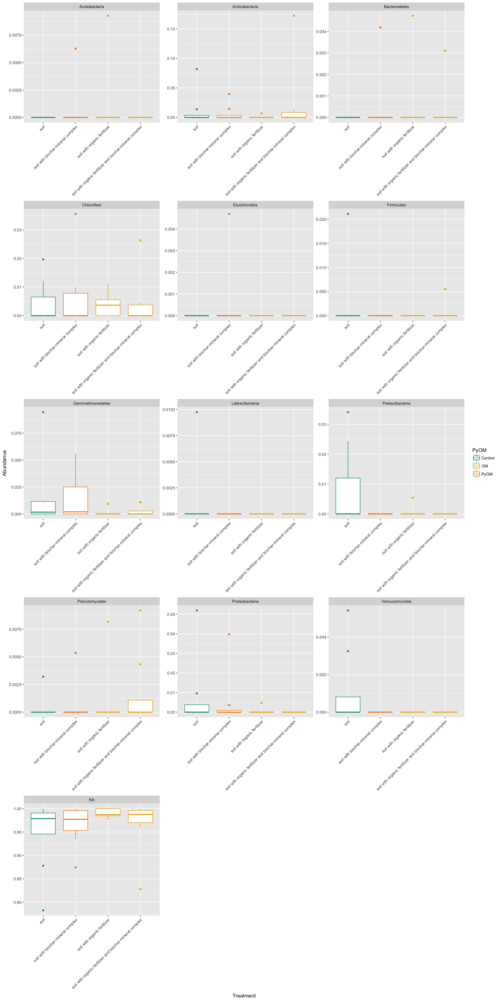

In [9]:
options(repr.plot.width=15, repr.plot.height=30)

#MajPhy = c("Verrucomicrobia", "Proteobacteria", "Planctomycetes", "Nitrospirae", "Gemmatimonadetes", "Firmicutes",
#"Chloroflexi", "Bacteroidetes", "Armatimonadetes", "Actinobacteria", "Acidobacteria")

#df = df %>%
#    filter(Phylum %in% MajPhy)%>%
#    mutate(SeverityLand = paste(Land_Class,Severity_Class))

p = ggplot(data=df_ye, aes(x =  Treatment , y = Abundance , color = PyOM))
p = p + geom_boxplot()
p = p + theme(axis.text.x = element_text(angle=45,hjust=1))
palette = c(wes_palette("Darjeeling1"),wes_palette("Darjeeling2")[1:4])
palette = palette[c(2,3,4,1,5,6,7,8,9)]
p = p + scale_color_manual(values=palette)
p = p + facet_wrap(~Phylum, scales="free", ncol=3)
p


#Author findings:
    #Over time, unamended community composition stayed consistant; PyOM amended varied a little; Stover varied a lot
    #No changes on day one; day 12 stover changed a lot, PyOM didn't change
    #Day 82 PyOM and stover community composition was distingushable from unamended
    
    #PyOM addition cause decrease in Armatimonadetes and increase in Bacteroidetes 

## Nielsen 2014

In [3]:
ps.nielsen2014.norm = transform_sample_counts(ps.nielsen2014, function(x) x/sum(x))

In [4]:
mdf_nielsen2014 = psmelt(ps.nielsen2014.norm)

In [5]:
mdf_nielsen2014

,OTU,Sample,Abundance,BioProject,TargetGene,EMBISampleID,Author,TotalC,Treatment,SRA,⋯,GeographicalLocation,NucleicAcidExtraction,PyOM,Domain,Phylum,Class,Order,Family,Genus,Species
100705,79ae2c2f8c966f38184481500c6b8a58,ERR1594104,0.22116494,,16S,1721.BMC.7.5T.18.1,Nielsen,4.53,High biochar,ERS1304339,⋯,Austrailia,MoBio PowerSoil 96 Well Soil DNA Isolation Kit,PyOM,Bacteria,Firmicutes,Bacilli,Bacillales,NA,NA,NA
100683,79ae2c2f8c966f38184481500c6b8a58,ERR1594125,0.21344092,,16S,1721.BMC.8.5T.23.1,Nielsen,4.53,High biochar,ERS1304360,⋯,Austrailia,MoBio PowerSoil 96 Well Soil DNA Isolation Kit,PyOM,Bacteria,Firmicutes,Bacilli,Bacillales,NA,NA,NA
100682,79ae2c2f8c966f38184481500c6b8a58,ERR1594106,0.20986019,,16S,1721.BMC.7.5T.18.3,Nielsen,4.53,High biochar,ERS1304341,⋯,Austrailia,MoBio PowerSoil 96 Well Soil DNA Isolation Kit,PyOM,Bacteria,Firmicutes,Bacilli,Bacillales,NA,NA,NA
100686,79ae2c2f8c966f38184481500c6b8a58,ERR1594313,0.20878737,,16S,1721.Soil.NIL.100.N.14.2,Nielsen,4.37,Fertilizer,ERS1304548,⋯,Austrailia,MoBio PowerSoil 96 Well Soil DNA Isolation Kit,OM,Bacteria,Firmicutes,Bacilli,Bacillales,NA,NA,NA
100680,79ae2c2f8c966f38184481500c6b8a58,ERR1594315,0.18470206,,16S,1721.Soil.NIL.100.N.22.1,Nielsen,4.37,Fertilizer,ERS1304550,⋯,Austrailia,MoBio PowerSoil 96 Well Soil DNA Isolation Kit,OM,Bacteria,Firmicutes,Bacilli,Bacillales,NA,NA,NA
100678,79ae2c2f8c966f38184481500c6b8a58,ERR1594115,0.15354200,,16S,1721.BMC.8.1T.11.3,Nielsen,4.43,Low biochar,ERS1304350,⋯,Austrailia,MoBio PowerSoil 96 Well Soil DNA Isolation Kit,PyOM,Bacteria,Firmicutes,Bacilli,Bacillales,NA,NA,NA
100693,79ae2c2f8c966f38184481500c6b8a58,ERR1594113,0.15109638,,16S,1721.BMC.8.1T.11.1,Nielsen,4.43,Low biochar,ERS1304348,⋯,Austrailia,MoBio PowerSoil 96 Well Soil DNA Isolation Kit,PyOM,Bacteria,Firmicutes,Bacilli,Bacillales,NA,NA,NA
100703,79ae2c2f8c966f38184481500c6b8a58,ERR1594127,0.15043905,,16S,1721.BMC.8.5T.23.3,Nielsen,4.53,High biochar,ERS1304362,⋯,Austrailia,MoBio PowerSoil 96 Well Soil DNA Isolation Kit,PyOM,Bacteria,Firmicutes,Bacilli,Bacillales,NA,NA,NA
100685,79ae2c2f8c966f38184481500c6b8a58,ERR1594317,0.14096290,,16S,1721.Soil.NIL.100.N.22.3,Nielsen,4.37,Fertilizer,ERS1304552,⋯,Austrailia,MoBio PowerSoil 96 Well Soil DNA Isolation Kit,OM,Bacteria,Firmicutes,Bacilli,Bacillales,NA,NA,NA
100684,79ae2c2f8c966f38184481500c6b8a58,ERR1594117,0.13958743,,16S,1721.BMC.8.1T.30.2,Nielsen,4.43,Low biochar,ERS1304352,⋯,Austrailia,MoBio PowerSoil 96 Well Soil DNA Isolation Kit,PyOM,Bacteria,Firmicutes,Bacilli,Bacillales,NA,NA,NA


In [6]:
df_nielsen2014 = mdf_nielsen2014 %>%
    group_by(Sample , Phylum , Treatment , PyOM )%>%
    summarize(Abundance=sum(Abundance))
# Grouping by sample, and phylum, add up total abundance of all OTUs in that phylum.

Sample,Phylum,Treatment,PyOM,Abundance
ERR1594095,Acidobacteria,Low biochar,PyOM,1.126939e-01
ERR1594095,Actinobacteria,Low biochar,PyOM,1.619256e-01
ERR1594095,Armatimonadetes,Low biochar,PyOM,1.149341e-03
ERR1594095,Bacteroidetes,Low biochar,PyOM,3.557114e-02
ERR1594095,Chlamydiae,Low biochar,PyOM,6.769426e-04
ERR1594095,Chloroflexi,Low biochar,PyOM,3.568315e-02
ERR1594095,Cyanobacteria,Low biochar,PyOM,9.253172e-05
ERR1594095,Deinococcus-Thermus,Low biochar,PyOM,0.000000e+00
ERR1594095,Dependentiae,Low biochar,PyOM,9.691480e-04
ERR1594095,Elusimicrobia,Low biochar,PyOM,1.728882e-03


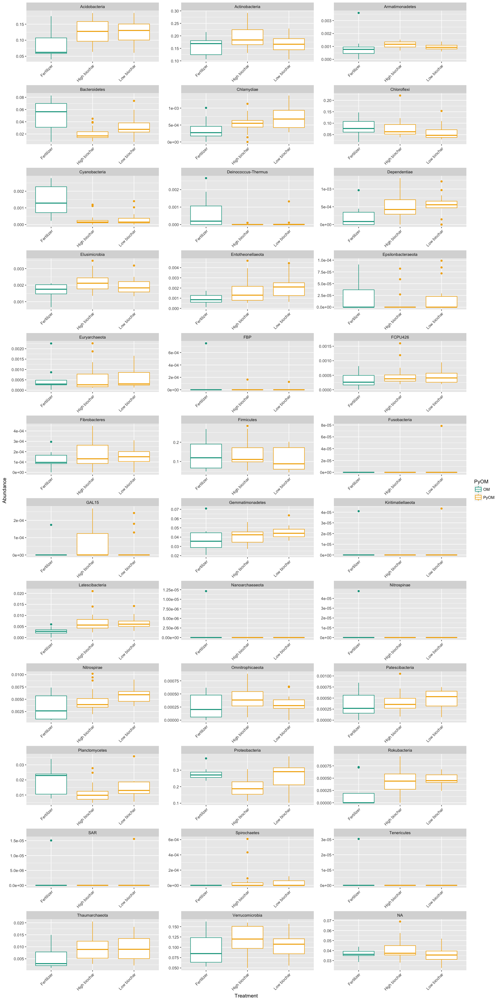

In [7]:
options(repr.plot.width=15, repr.plot.height=30)

#MajPhy = c("Verrucomicrobia", "Proteobacteria", "Planctomycetes", "Nitrospirae", "Gemmatimonadetes", "Firmicutes",
#"Chloroflexi", "Bacteroidetes", "Armatimonadetes", "Actinobacteria", "Acidobacteria")

#df = df %>%
#    filter(Phylum %in% MajPhy)%>%
#    mutate(SeverityLand = paste(Land_Class,Severity_Class))

p = ggplot(data=df_nielsen2014, aes(x =  Treatment , y = Abundance , color = PyOM))
p = p + geom_boxplot()
p = p + theme(axis.text.x = element_text(angle=45,hjust=1))
palette = c(wes_palette("Darjeeling1"),wes_palette("Darjeeling2")[1:4])
palette = palette[c(2,3,4,1,5,6,7,8,9)]
p = p + scale_color_manual(values=palette)
p = p + facet_wrap(~Phylum, scales="free", ncol=3)
p


#Author findings:
   

## Relative Abundance for Control Samples

In [28]:
# want to make baseline graphs for the controls with the study on the x axis
#include different plots for soil type for cases where more than one soil was included in the study

#Variables we want: Sample Name, Phylum, Control, Abundance

In [8]:
ps.norm = transform_sample_counts(ps.glom.genus, function(x) x/sum(x))                                                             

In [9]:
mdf = psmelt(ps.norm)

In [11]:
mdf$t.per.ha.PyOM = as.factor(mdf$t.per.ha.PyOM)
mdf$g.per.kg.PyOM = as.factor(mdf$g.per.kg.PyOM)
mdf$Incubation_Time_Weeks = as.factor(mdf$Incubation_Time_Weeks)
# Making rates factors

levels(mdf$t.per.ha.PyOM)
levels(mdf$g.per.kg.PyOM)
levels(mdf$Incubation_Time_Weeks)

[1] "0"     "1.1"   "1.5"   "100"   "14.26" "160"   "2.3"   "20"    "200"  
[10] "25"    "4.1"   "40"    "5.44"  "50"    "80"    "NA"

[1] "0"    "10.1" "20.4" "30"

[1] "0"   "1.5" "104" "112" "12"  "121" "128" "13"  "20"  "21"  "24"  "34" 
[13] "4"   "45"  "6"   "8.5"

In [12]:
mdf$t.per.ha.PyOM = factor(mdf$t.per.ha.PyOM, levels = c('0','1.1',"1.5",'2.3', '4.1', '5.44','14.26',"20",'25', '50', "80",'100',"160",'200',  'NA'))
mdf$g.per.kg.PyOM = factor(mdf$g.per.kg.PyOM, levels = c('0' ,'1.5' ,'10.1' ,'20.4' ,'30', 'NA'))
mdf$Incubation_Time_Weeks = factor(mdf$Incubation_Time_Weeks, levels = c('0','1.5','4','6','8.5','12','13',"20","21",'24','34','45','104','112','121','128' ))
# Being sure they are in increasing order
# However, same problem happens when converted to full text. Need to reorder after creating SoilXLabel.

In [13]:
df.full = mdf %>%
    filter(Incubation_Time_Weeks != 0)%>%
    mutate(SoilTypeName = paste(SoilType," (",Author,")",sep=""), SoilType)%>%
    group_by(Author , Phylum , PyOM, Feedstock, t.per.ha.PyOM, g.per.kg.PyOM, PyOM.Temp, SoilType, SoilTypeName, Sample,Incubation_Time_Weeks) %>%
    summarize(Abundance=sum(Abundance))%>%
    mutate(SoilXLabel = paste(SoilTypeName,Author,Incubation_Time_Weeks,PyOM,Feedstock,t.per.ha.PyOM,g.per.kg.PyOM,PyOM.Temp))%>%
    mutate(CharType = paste(PyOM,Feedstock,t.per.ha.PyOM,g.per.kg.PyOM,PyOM.Temp,Incubation_Time_Weeks))%>%
    mutate(Time_Category = ifelse(PyOM=="Control", "Control",
                                 ifelse(as.numeric(Incubation_Time_Weeks)<100, "PyOM Short","PyOM Long")))%>%
    mutate(Time_Facet = ifelse(Incubation_Time_Weeks == 0, "Initial",
                                 ifelse(as.numeric(Incubation_Time_Weeks)<100, "PyOM Short","PyOM Long")))%>%
    mutate(Temp_Category = ifelse(PyOM=="Control", "Control",paste(PyOM,PyOM.Temp)))
# Grouping by sample, and phylum, add up total abundance of all OTUs in that phylum.

Warning message:
“Factor `t.per.ha.PyOM` contains implicit NA, consider using `forcats::fct_explicit_na`”Warning message:
“Factor `g.per.kg.PyOM` contains implicit NA, consider using `forcats::fct_explicit_na`”Warning message:
“Factor `t.per.ha.PyOM` contains implicit NA, consider using `forcats::fct_explicit_na`”Warning message:
“Factor `g.per.kg.PyOM` contains implicit NA, consider using `forcats::fct_explicit_na`”Warning message:
“Factor `t.per.ha.PyOM` contains implicit NA, consider using `forcats::fct_explicit_na`”Warning message:
“Factor `g.per.kg.PyOM` contains implicit NA, consider using `forcats::fct_explicit_na`”Warning message:
“Factor `t.per.ha.PyOM` contains implicit NA, consider using `forcats::fct_explicit_na`”Warning message:
“Factor `g.per.kg.PyOM` contains implicit NA, consider using `forcats::fct_explicit_na`”Warning message:
“Factor `t.per.ha.PyOM` contains implicit NA, consider using `forcats::fct_explicit_na`”Warning message:
“Factor `g.per.kg.PyOM` contains impli

In [14]:
SoilXLabel.order = df.full%>%
    arrange(SoilType,Author,Incubation_Time_Weeks,PyOM,Feedstock,PyOM.Temp,t.per.ha.PyOM,g.per.kg.PyOM,SoilXLabel)
df.full$SoilXLabel = factor(df.full$SoilXLabel,levels=unique(SoilXLabel.order$SoilXLabel))

Warning message:
“Factor `t.per.ha.PyOM` contains implicit NA, consider using `forcats::fct_explicit_na`”Warning message:
“Factor `g.per.kg.PyOM` contains implicit NA, consider using `forcats::fct_explicit_na`”

In [15]:
# Setting up labels for X axis plotting to indicate just study and timepoint on label

df.xLabels = df.full %>%
    filter(PyOM %in% c("Control","PyOM"))%>%
    group_by(SoilXLabel,Author,SoilType,Incubation_Time_Weeks)%>%
    summarize(n())
df.xLabels = ifelse(df.xLabels$SoilType=="Gleysol", paste(df.xLabels$SoilType," (",df.xLabels$Author,")",sep=""), 
                    ifelse(df.xLabels$SoilType == "Fragiudept", paste(df.xLabels$SoilType," (",df.xLabels$Incubation_Time_Weeks,")",sep=""),
                        ifelse(df.xLabels$SoilType == "Mollisol", paste(df.xLabels$SoilType," (",df.xLabels$Incubation_Time_Weeks,")",sep=""),df.xLabels$SoilType)))


xLabels = c(1:length(df.xLabels))

for (i in 1:length(df.xLabels)) {
    if (i>1) {
        x = df.xLabels[i]
        y = df.xLabels[i-1]
        if (is.na(df.xLabels[i])) {x = "NA"}
        if (is.na(df.xLabels[i-1])){y = "NA"}
        }
    if (i==1){
        x = df.xLabels[i]
        y = "whatever"
    }
    if (x == y){xLabels[i]=""}
    if (x != y){xLabels[i]=x}
}

In [16]:
xLabels

[1] "Argiustoll"       ""                 ""                 "Cambisol"        
 [5] ""                 ""                 ""                 ""                
 [9] "Ferralsol"        ""                 ""                 "Fluvisol"        
[13] ""                 "Fragiudept (1.5)" ""                 "Fragiudept (12)" 
[17] ""                 "Gleysol (Song)"   ""                 ""                
[21] ""                 ""                 ""                 ""                
[25] ""                 ""                 ""                 ""                
[29] ""                 ""                 ""                 "Gleysol (Wu)"    
[33] ""                 "Inceptisol"       ""                 ""                
[37] "Luvisol"          ""                 ""                 "Mollisol (104)"  
[41] ""                 ""                 ""                 "Mollisol (112)"  
[45] ""                 ""                 ""                 "Mollisol (121)"  
[49] ""                 ""                 ""                 "Mollisol (128)"  
[53] ""                 ""                 ""                 "Psammaquent"     
[57] ""                 ""

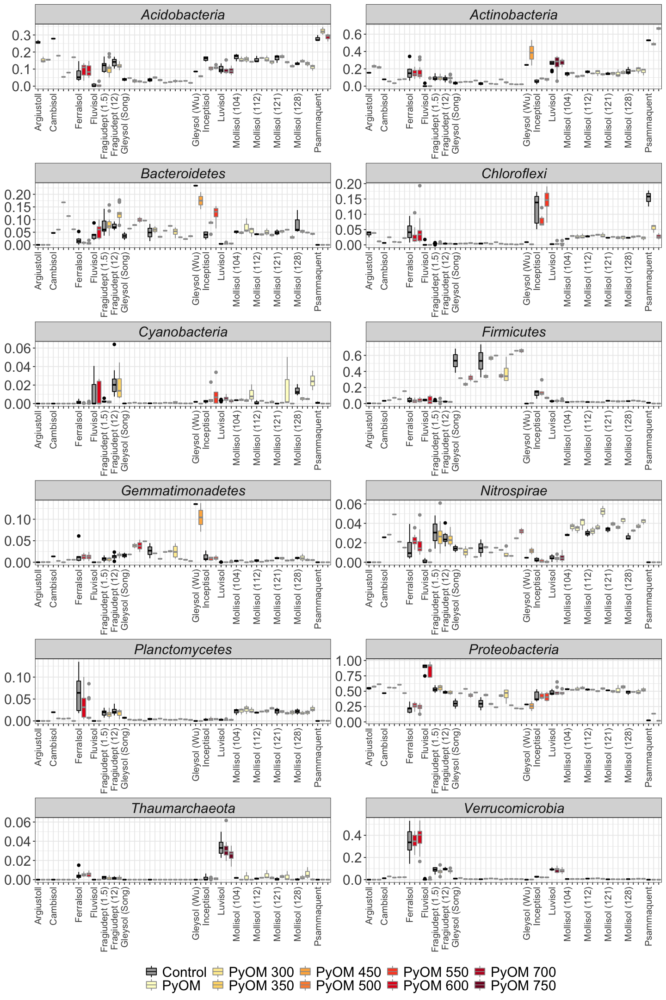

In [18]:
options(repr.plot.width=12, repr.plot.height=18)

AllPhy = c("Acidobacteria", "Verrucomicrobia", "Actinobacteria", "Armatimonadetes", "Bacteroidetes", "Chloroflexi", "Cyanobacteria", 
           "Deinococcus-Thermus", "Elusimicrobia", "Entotheonellaeota", "Euryarchaeota", "Fibrobacteres", 
           "Firmicutes", "Fusobacteria", "Gemmatimonadetes", "Halanaerobiaeota", "Latescibacteria", "Nitrospirae", 
           "Omnitrophicaeota", "Patescibacteria", "Planctomycetes", "Proteobacteria", "Rokubacteria", "Spirochaetes", 
            "Tenericutes", "Thaumarchaeota", "WPS-2")

SelPhy = c("Acidobacteria", "Verrucomicrobia", "Actinobacteria","Bacteroidetes", "Chloroflexi", "Cyanobacteria", 
           "Firmicutes", "Gemmatimonadetes","Nitrospirae", "Planctomycetes", "Proteobacteria", "Thaumarchaeota")


df.control = df.full %>%
    filter(Phylum %in% SelPhy)%>%
    filter(PyOM %in% c("Control","PyOM"))

p = ggplot(data=df.control, aes(x =  SoilXLabel , y = Abundance, fill = Temp_Category, color = Temp_Category))
p = p + geom_boxplot()
p = p + theme_bw()
p = p + theme(axis.text.y = element_text(size=18),axis.text.x = element_text(size=12),
              strip.text=element_text(size=18),legend.text=element_text(size=18))
p = p + theme(axis.title = element_blank())
p = p + theme(axis.text.x = element_text(angle=90,hjust=1, vjust=0.5))
palette.fill = c("darkgrey",brewer.pal(9,"YlOrRd"))
p = p + scale_fill_manual(values=palette.fill,guide=guide_legend(title = NULL))
palette.col = c("black",rep("gray60",9))
p = p + scale_color_manual(values=palette.col,guide=guide_legend(title = NULL))
p = p + facet_wrap(~Phylum, scales="free",ncol=2)
p = p + theme(legend.position="bottom",strip.text=element_text(face="italic"))
p = p + scale_x_discrete(labels=xLabels)
p 

## Comparing to baseline

In [19]:
df.Baseline = mdf %>%
    filter(Incubation_Time_Weeks != 0)%>%
    filter(PyOM %in% c("PyOM","Control"))%>%
    group_by(Sample,Phylum,SoilType,Author,Incubation_Time_Weeks,PyOM,Feedstock,t.per.ha.PyOM,g.per.kg.PyOM,PyOM.Temp)%>%
    summarize(Abundance = sum(Abundance))%>%
    mutate(SoilBaseline = paste(SoilType,Author,Incubation_Time_Weeks,Phylum))%>%
    group_by(SoilBaseline)%>%
    mutate(AbundanceBaseline=mean(Abundance[PyOM=="Control"]))%>%
    group_by(Sample)%>%
    mutate(AbundanceDiff = Abundance-AbundanceBaseline)%>%
    mutate(AbundanceDiffFract = (Abundance-AbundanceBaseline)/AbundanceBaseline)%>%
    arrange(AbundanceBaseline,PyOM)
#head(df.Baseline[df.Baseline$Phylum=="Acidobacteria"&df.Baseline$PyOM=="PyOM",])

Warning message:
“Factor `t.per.ha.PyOM` contains implicit NA, consider using `forcats::fct_explicit_na`”Warning message:
“Factor `g.per.kg.PyOM` contains implicit NA, consider using `forcats::fct_explicit_na`”Warning message:
“Factor `t.per.ha.PyOM` contains implicit NA, consider using `forcats::fct_explicit_na`”Warning message:
“Factor `g.per.kg.PyOM` contains implicit NA, consider using `forcats::fct_explicit_na`”

In [20]:
as.numeric(paste(levels(df.Baseline$Incubation_Time_Weeks)))<100
levels(df.Baseline$Incubation_Time_Weeks)

[1]  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE  TRUE
[13] FALSE FALSE FALSE FALSE

[1] "0"   "1.5" "4"   "6"   "8.5" "12"  "13"  "20"  "21"  "24"  "34"  "45" 
[13] "104" "112" "121" "128"

In [21]:
tail(df.Baseline$Incubation_Time_Weeks)
tail(as.numeric(paste(df.Baseline$Incubation_Time_Weeks)))

[1] 24 24 24 24 24 24
Levels: 0 1.5 4 6 8.5 12 13 20 21 24 34 45 104 112 121 128

[1] 24 24 24 24 24 24

In [22]:
head(df.Baseline$Time_Category)

Warning message:
“Unknown or uninitialised column: 'Time_Category'.”

NULL

In [23]:
df.Baseline = df.Baseline %>%
    filter(Incubation_Time_Weeks != 0)%>%
    filter(PyOM=="PyOM")%>%
    group_by(Author , Phylum , PyOM, Feedstock, t.per.ha.PyOM, g.per.kg.PyOM, PyOM.Temp, SoilType, Sample,Incubation_Time_Weeks) %>%
    mutate(SoilXLabel = paste(SoilType,Author,Incubation_Time_Weeks,Feedstock,t.per.ha.PyOM,g.per.kg.PyOM,PyOM.Temp))%>%
    mutate(CharType = paste(Feedstock,t.per.ha.PyOM,g.per.kg.PyOM,PyOM.Temp,Incubation_Time_Weeks))%>%
    #mutate(Time_Category = ifelse(Incubation_Time_Weeks<100, "PyOM Short","PyOM Long"))%>%
    mutate(Time_Category = ifelse(as.numeric(paste(Incubation_Time_Weeks))<100, "PyOM Short","PyOM Long"))%>%
    mutate(Temp_Category = paste(PyOM,PyOM.Temp))%>%
    mutate(Feedstock_Category = ifelse(Feedstock %in% c('commercial cornstock powder', 'corn stover', 'corncob',"Corn Straw"), "Corn",
                                       ifelse(Feedstock %in% c('wheat straw','winter wheat'),"Wheat",
                                              ifelse(Feedstock %in% c('Jarrah wood'),"Eucalyptus wood",
                                                    ifelse(Feedstock =='Manure', "Manure","Unknown")))))


SoilXLabel.order = df.Baseline%>%
    arrange(Feedstock,SoilType,Author,Incubation_Time_Weeks,PyOM,PyOM.Temp,t.per.ha.PyOM,g.per.kg.PyOM,SoilXLabel)
df.Baseline$SoilXLabel = factor(df.Baseline$SoilXLabel,levels=unique(SoilXLabel.order$SoilXLabel))

df.xLabels = df.Baseline %>%
    group_by(SoilXLabel,Author,SoilType)%>%
    summarize(n())

df.xLabels = ifelse(df.xLabels$Author == "Ye", "(Ye)",
                    ifelse(df.xLabels$SoilType=="Gleysol", paste(df.xLabels$SoilType," (",df.xLabels$Author,")",sep=""), df.xLabels$SoilType))

xLabels = c(1:length(df.xLabels))
#xLabels
for (i in 1:length(df.xLabels)) {
    if (i>1) {
        x = df.xLabels[i]
        y = df.xLabels[i-1]
        if (is.na(df.xLabels[i])) {x = "NA"}
        if (is.na(df.xLabels[i-1])){y = "NA"}
        }
    if (i==1){
        x = df.xLabels[i]
        y = "whatever"
    }
    if (x == y){xLabels[i]=""}
    if (x != y){xLabels[i]=x}
    #print(xLabels[i])
}

Warning message:
“Factor `t.per.ha.PyOM` contains implicit NA, consider using `forcats::fct_explicit_na`”Warning message:
“Factor `g.per.kg.PyOM` contains implicit NA, consider using `forcats::fct_explicit_na`”Warning message:
“Factor `t.per.ha.PyOM` contains implicit NA, consider using `forcats::fct_explicit_na`”Warning message:
“Factor `g.per.kg.PyOM` contains implicit NA, consider using `forcats::fct_explicit_na`”Warning message:
“Factor `t.per.ha.PyOM` contains implicit NA, consider using `forcats::fct_explicit_na`”Warning message:
“Factor `g.per.kg.PyOM` contains implicit NA, consider using `forcats::fct_explicit_na`”Warning message:
“Factor `t.per.ha.PyOM` contains implicit NA, consider using `forcats::fct_explicit_na`”Warning message:
“Factor `g.per.kg.PyOM` contains implicit NA, consider using `forcats::fct_explicit_na`”Warning message:
“Factor `t.per.ha.PyOM` contains implicit NA, consider using `forcats::fct_explicit_na`”Warning message:
“Factor `g.per.kg.PyOM` contains impli

In [24]:
xLabels

[1] "Mollisol"       ""               ""               ""              
 [5] ""               ""               ""               ""              
 [9] ""               ""               ""               ""              
[13] "Fragiudept"     ""               "Cambisol"       ""              
[17] ""               ""               "Gleysol (Wu)"   "Ferralsol"     
[21] ""               "(Ye)"           "Argiustoll"     ""              
[25] "Inceptisol"     "Psammaquent"    ""               "Inceptisol"    
[29] "Gleysol (Song)" ""               ""               ""              
[33] ""               ""               ""               ""              
[37] ""               ""               ""               ""              
[41] "Luvisol"        ""

Warning message:
“Ignoring unknown parameters: type”Warning message:
“Removed 212 rows containing non-finite values (stat_boxplot).”

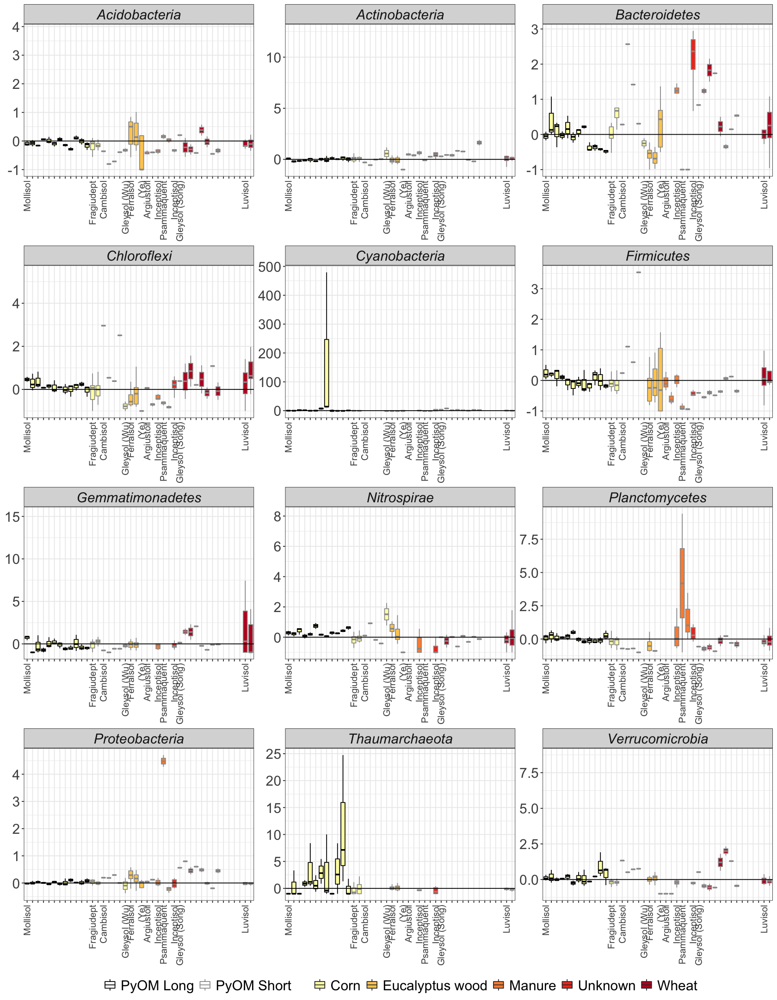

In [25]:
options(repr.plot.width=14, repr.plot.height=18)

AllPhy = c("Acidobacteria", "Verrucomicrobia", "Actinobacteria", "Armatimonadetes", "Bacteroidetes", "Chloroflexi", "Cyanobacteria", 
           "Deinococcus-Thermus", "Elusimicrobia", "Entotheonellaeota", "Euryarchaeota", "Fibrobacteres", 
           "Firmicutes", "Fusobacteria", "Gemmatimonadetes", "Halanaerobiaeota", "Latescibacteria", "Nitrospirae", 
           "Omnitrophicaeota", "Patescibacteria", "Planctomycetes", "Proteobacteria", "Rokubacteria", "Spirochaetes", 
            "Tenericutes", "Thaumarchaeota", "WPS-2")

SelPhy = c("Acidobacteria", "Verrucomicrobia", "Actinobacteria","Bacteroidetes", "Chloroflexi", "Cyanobacteria", 
           "Firmicutes", "Gemmatimonadetes","Nitrospirae", "Planctomycetes", "Proteobacteria", "Thaumarchaeota")


df.control = df.Baseline %>%
    filter(Phylum %in% SelPhy)%>%
    filter(PyOM %in% c("Control","PyOM"))

p = ggplot(data=df.control, aes(x =  SoilXLabel , y = AbundanceDiffFract, fill=Feedstock_Category, color = Time_Category))
p = p + geom_boxplot(outlier.shape=NA)
p = p + theme_bw()
p = p + theme(axis.text.y = element_text(size=18),axis.text.x = element_text(size=12),
              strip.text=element_text(size=18),legend.text=element_text(size=18))
p = p + theme(axis.title = element_blank())
p = p + theme(axis.text.x = element_text(angle=90,hjust=1, vjust=0.5))
palette.fill = c(brewer.pal(5,"YlOrRd"))
p = p + scale_fill_manual(values=palette.fill,guide=guide_legend(title = NULL))
palette.col = c("black",rep("gray60",9))
p = p + scale_color_manual(values=palette.col,guide=guide_legend(title = NULL))
p = p + facet_wrap(~Phylum, scales="free",ncol=3)
p = p + theme(legend.position="bottom",strip.text=element_text(face="italic"))
p = p + scale_x_discrete(labels=xLabels)
p = p + geom_hline(yintercept=0, type=2)
#p = p + ylim(values=c(-2,2))
p 

## Abundances just in initial soil, no PyOM

In [10]:
#want to pull out just control

df_control <- subset(mdf, PyOM == "Control")
head(df_control)
df_PyOM <- subset(mdf, PyOM == "PyOM")

,OTU,Sample,Abundance,ForwardPrimerName,SoilType,NucleicAcidExtraction,Feedstock,GeographicalLocation,ReversePrimerSequence,pH,⋯,Avail_K,Org_C,Avail_P,TSN,Domain,Phylum,Class,Order,Family,Genus
,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<fct>,<fct>,<fct>,<fct>,<fct>,<fct>
279377,Sphingomonas,SRR3681471-X,0.5185983,338F,Argiustoll,MoBio PowerSoil DNA Isolation Kit,NA,China,GGACTACHVGGGTWTCTAAT,NA,⋯,NA,NA,NA,NA,Bacteria,Proteobacteria,Alphaproteobacteria,Sphingomonadales,Sphingomonadaceae,Sphingomonas
279362,Sphingomonas,SRR3681441-X,0.5067573,338F,Argiustoll,MoBio PowerSoil DNA Isolation Kit,NA,China,GGACTACHVGGGTWTCTAAT,NA,⋯,NA,NA,NA,NA,Bacteria,Proteobacteria,Alphaproteobacteria,Sphingomonadales,Sphingomonadaceae,Sphingomonas
279650,Sphingomonas,SRR3681442-X,0.4840315,338F,Argiustoll,MoBio PowerSoil DNA Isolation Kit,NA,China,GGACTACHVGGGTWTCTAAT,NA,⋯,NA,NA,NA,NA,Bacteria,Proteobacteria,Alphaproteobacteria,Sphingomonadales,Sphingomonadaceae,Sphingomonas
246983,Pythium insidiosum,SRR2559858-X,0.4652087,27F,Fluvisol,Mobio PowerSoil DNA Isolation Kit,NA,China,GWATTACCGCGGCKGCTG,8.21,⋯,133.52,9.54,10.24,36.99,Bacteria,Proteobacteria,Alphaproteobacteria,Rickettsiales,Mitochondria,Pythium insidiosum
178758,Methylophaga,SRR2559877-X,0.4345351,27F,Fluvisol,Mobio PowerSoil DNA Isolation Kit,NA,China,GWATTACCGCGGCKGCTG,8.21,⋯,133.52,9.54,10.24,36.99,Bacteria,Proteobacteria,Gammaproteobacteria,Nitrosococcales,Methylophagaceae,Methylophaga
61891,Candidatus Udaeobacter,ERR1594316,0.3687609,515f,Ferralsol,MoBio PowerSoil 96 Well Soil DNA Isolation Kit,Jarrah wood,Austrailia,GGACTACHVGGGTWTCTAAT,4.6,⋯,NA,NA,NA,NA,Bacteria,Verrucomicrobia,Verrucomicrobiae,Chthoniobacterales,Chthoniobacteraceae,Candidatus Udaeobacter


In [26]:
df.control = df_control %>%
    group_by(Author , Phylum , PyOM, SoilType, Sample) %>%
    summarize(Abundance=sum(Abundance))
# Grouping by sample, and phylum, add up total abundance of all OTUs in that phylum.

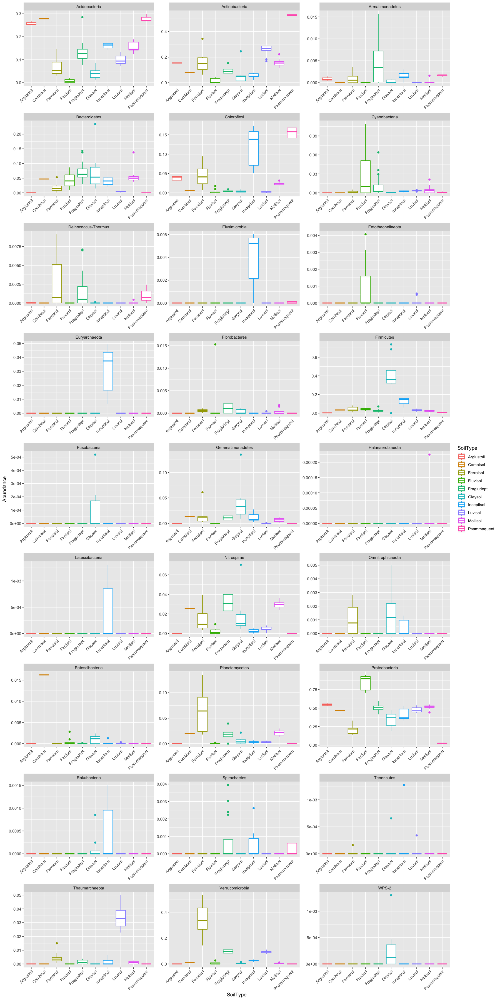

In [27]:
options(repr.plot.width=15, repr.plot.height=30)

MajPhy = c("Acidobacteria", "Verrucomicrobia", "Actinobacteria", "Armatimonadetes", "Bacteroidetes", "Chloroflexi", "Cyanobacteria", 
           "Deinococcus-Thermus", "Elusimicrobia", "Entotheonellaeota", "Euryarchaeota", "Fibrobacteres", 
           "Firmicutes", "Fusobacteria", "Gemmatimonadetes", "Halanaerobiaeota", "Latescibacteria", "Nitrospirae", 
           "Omnitrophicaeota", "Patescibacteria", "Planctomycetes", "Proteobacteria", "Rokubacteria", "Spirochaetes", 
            "Tenericutes", "Thaumarchaeota", "WPS-2")

df.control = df.control %>%
    filter(Phylum %in% MajPhy)

p = ggplot(data=df.control, aes(x =  SoilType , y = Abundance , color = SoilType))
p = p + geom_boxplot()
p = p + theme(axis.text.x = element_text(angle=45,hjust=1))
p = p + facet_wrap(~Phylum, scales="free", ncol=3)
p 

In [36]:
#saveRDS(p, "RelativeAbund.Control.figure")

## Relative abundance in just PyOM-amended samples

In [28]:
df.PyOM = df_PyOM %>%
    group_by(Author , Phylum , PyOM, SoilType, Sample) %>%
    summarize(Abundance=sum(Abundance))
# Grouping by sample, and phylum, add up total abundance of all OTUs in that phylum.
unique(df.PyOM$Phylum)

[1] Acidobacteria       Actinobacteria      Armatimonadetes    
 [4] Bacteroidetes       Chlamydiae          Chloroflexi        
 [7] Cyanobacteria       Deinococcus-Thermus Elusimicrobia      
[10] Entotheonellaeota   Epsilonbacteraeota  Euryarchaeota      
[13] Fibrobacteres       Firmicutes          Fusobacteria       
[16] Gemmatimonadetes    Halanaerobiaeota    Latescibacteria    
[19] Nanoarchaeaeota     Nitrospinae         Nitrospirae        
[22] Omnitrophicaeota    Opisthokonta        Patescibacteria    
[25] Planctomycetes      Proteobacteria      Rokubacteria       
[28] Spirochaetes        Synergistetes       Tenericutes        
[31] Thaumarchaeota      Verrucomicrobia     WPS-2              
33 Levels: Acidobacteria Actinobacteria Armatimonadetes ... WPS-2

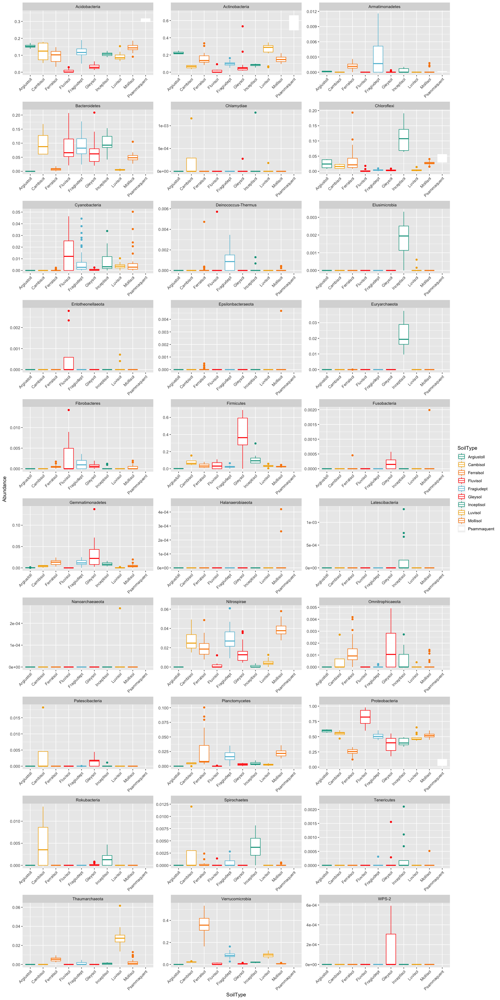

In [31]:
options(repr.plot.width=15, repr.plot.height=30)

MajPhy = c("Acidobacteria", "Actinobacteria", "Armatimonadetes", "Bacteroidetes", "Chlamydiae", "Chloroflexi",
           "Cyanobacteria", "Deinococcus-Thermus", "Elusimicrobia", "Entotheonellaeota", "Epsilonbacteraeota",
           "Euryarchaeota", "Fibrobacteres", "Firmicutes", "Fusobacteria", "Gemmatimonadetes", "Halanaerobiaeota",
           "Latescibacteria", "Nanoarchaeaeota", "Nitrospirae", "Omnitrophicaeota", "Patescibacteria", "Planctomycetes",
           "Proteobacteria", "Rokubacteria", "Spirochaetes", "Tenericutes", "Thaumarchaeota", "Verrucomicrobia", "WPS-2")

df.PyOM = df.PyOM %>%
    filter(Phylum %in% MajPhy)

p = ggplot(data=df.PyOM, aes(x =  SoilType , y = Abundance , color = SoilType))
p = p + geom_boxplot()
p = p + theme(axis.text.x = element_text(angle=45,hjust=1))
palette = c(wes_palette("Darjeeling1"),wes_palette("Darjeeling1")[1:4])
palette = palette[c(2,3,4,1,5,6,7,8,9,10)]
p = p + scale_color_manual(values=palette)
p = p + facet_wrap(~Phylum, scales="free", ncol=3)
p

In [41]:
#saveRDS(p, "RelativeAbund.PyOM.figure")